In [1]:
import infercnvpy as cnv
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import scipy
sc.settings.verbosity = 3
sc.logging.print_header()
sc.set_figure_params(dpi=100, dpi_save=600)

import matplotlib.pyplot as pl
from matplotlib import rcParams

import os

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/umap/d

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.21.6 scipy==1.11.1 pandas==1.3.5 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.6 louvain==0.8.0 pynndescent==0.5.10


In [12]:
adata_mal=sc.read('YS_cnv_adata_epi_after_hallmarks.h5ad')
adata_mal

AnnData object with n_obs × n_vars = 25439 × 5000
    obs: 'predicted_doublets', 'batch', 'cnv_score', 'Metastases', 'cnv_status', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'Mal_Epi_Cluster', 'HALLMARK_TNFA_SIGNALING_VIA_NFKB', 'HALLMARK_HYPOXIA', 'HALLMARK_CHOLESTEROL_HOMEOSTASIS', 'HALLMARK_MITOTIC_SPINDLE', 'HALLMARK_WNT_BETA_CATENIN_SIGNALING', 'HALLMARK_TGF_BETA_SIGNALING', 'HALLMARK_IL6_JAK_STAT3_SIGNALING', 'HALLMARK_DNA_REPAIR', 'HALLMARK_G2M_CHECKPOINT', 'HALLMARK_APOPTOSIS', 'HALLMARK_NOTCH_SIGNALING', 'HALLMARK_ADIPOGENESIS', 'TNFA_SIGNALING_VIA_NFKB', 'HYPOXIA', 'CHOLESTEROL_HOMEOSTASIS', 'MITOTIC_SPINDLE', 'WNT_BETA_CATENIN_SIGNALING', 'TGF_BETA_SIGNALING', 'IL6_JAK_STAT3_SIGNALING', 'DNA_REPAIR', 'G2M_CHECKPOINT', 'APOPTOSIS', 'NOTCH_SIGNALING', 'ADIPOGENESIS', 'ESTROGEN_RESPONSE_EARLY', 'ESTROGEN_RESPONSE_LATE', 'ANDROGEN_RESPONSE', 'MYOGENESIS', 'PROTEIN_SECRETION', 'INTERFERON_ALPHA_RESPONSE',

In [32]:
adata_mal=adata[adata.obs['cnv_status'].isin(['CNV_Malignant'])]
adata_mal

View of AnnData object with n_obs × n_vars = 25440 × 36601
    obs: 'predicted_doublets', 'batch', 'cnv_score', 'Metastases', 'cnv_status'
    var: 'gene_ids'

In [33]:
adata_mal.var['mt'] = adata_mal.var_names.str.startswith('MT-')
adata_mal.var['rp'] = adata_mal.var_names.str.startswith('RPL') | adata_mal.var_names.str.startswith('RPS')
sc.pp.calculate_qc_metrics(adata_mal, qc_vars=['mt','rp'], percent_top=None, log1p=False, inplace=True)
adata_mal = adata_mal[adata_mal.obs.n_genes_by_counts < 8000, :]
adata_mal = adata_mal[adata_mal.obs.pct_counts_mt < 20, :]
adata_mal = adata_mal[adata_mal.obs.pct_counts_rp < 50, :]
sc.pp.normalize_total(adata_mal, target_sum=1e4)
sc.pp.log1p(adata_mal)
sc.pp.highly_variable_genes(adata_mal, n_top_genes=5000)
adata_mal.raw=adata_mal
adata_mal = adata_mal[:, adata_mal.var.highly_variable]
adata_mal

/tmp/ipykernel_8768/599571187.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata_mal.var['mt'] = adata_mal.var_names.str.startswith('MT-')
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 25439 × 5000
    obs: 'predicted_doublets', 'batch', 'cnv_score', 'Metastases', 'cnv_status', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [34]:
sc.pp.regress_out(adata_mal, keys=['total_counts', 'pct_counts_mt','pct_counts_rp'], n_jobs=16)
sc.pp.scale(adata_mal, max_value=10)
adata_mal

regressing out ['total_counts', 'pct_counts_mt', 'pct_counts_rp']
    sparse input is densified and may lead to high memory use
    finished (0:00:22)


AnnData object with n_obs × n_vars = 25439 × 5000
    obs: 'predicted_doublets', 'batch', 'cnv_score', 'Metastases', 'cnv_status', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'

In [35]:
sc.tl.pca(adata_mal, svd_solver='arpack')
sce.pp.harmony_integrate(adata_mal, key='batch', basis='X_pca', adjusted_basis='X_pca_harmony')
adata_mal.obsm['X_pca']=adata_mal.obsm['X_pca_harmony']

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:08)


2023-07-19 10:09:22,171 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2023-07-19 10:09:48,761 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2023-07-19 10:09:49,081 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2023-07-19 10:10:19,746 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2023-07-19 10:10:51,386 - harmonypy - INFO - Converged after 2 iterations
INFO:harmonypy:Converged after 2 iterations


In [36]:
sc.pp.neighbors(adata_mal, n_neighbors=15, n_pcs=30, knn=True)
sc.tl.leiden(adata_mal, resolution=0.3)
sc.tl.umap(adata_mal)
adata_mal

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:24)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


AnnData object with n_obs × n_vars = 25439 × 5000
    obs: 'predicted_doublets', 'batch', 'cnv_score', 'Metastases', 'cnv_status', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [9]:
adata_fib=sc.read("/mnt/g/YS_work2/2.Scanpy_stro/YS_fib_after_subcelltype_new.h5ad")
adata_fib

AnnData object with n_obs × n_vars = 4106 × 5000
    obs: 'predicted_doublets', 'batch', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'Fib_Cluster'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Fib_Cluster_colors', 'Metastases_colors', 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [16]:
merged_adata = sc.concat([adata_fib, adata_mal], join="outer", label="Fib_Epi_Cluster")
merged_adata

AnnData object with n_obs × n_vars = 29545 × 8571
    obs: 'predicted_doublets', 'batch', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'Fib_Cluster', 'cnv_score', 'cnv_status', 'Mal_Epi_Cluster', 'HALLMARK_TNFA_SIGNALING_VIA_NFKB', 'HALLMARK_HYPOXIA', 'HALLMARK_CHOLESTEROL_HOMEOSTASIS', 'HALLMARK_MITOTIC_SPINDLE', 'HALLMARK_WNT_BETA_CATENIN_SIGNALING', 'HALLMARK_TGF_BETA_SIGNALING', 'HALLMARK_IL6_JAK_STAT3_SIGNALING', 'HALLMARK_DNA_REPAIR', 'HALLMARK_G2M_CHECKPOINT', 'HALLMARK_APOPTOSIS', 'HALLMARK_NOTCH_SIGNALING', 'HALLMARK_ADIPOGENESIS', 'TNFA_SIGNALING_VIA_NFKB', 'HYPOXIA', 'CHOLESTEROL_HOMEOSTASIS', 'MITOTIC_SPINDLE', 'WNT_BETA_CATENIN_SIGNALING', 'TGF_BETA_SIGNALING', 'IL6_JAK_STAT3_SIGNALING', 'DNA_REPAIR', 'G2M_CHECKPOINT', 'APOPTOSIS', 'NOTCH_SIGNALING', 'ADIPOGENESIS', 'ESTROGEN_RESPONSE_EARLY', 'ESTROGEN_RESPONSE_LATE', 'ANDROGEN_RESPONSE', 'MYOGENESIS', 'PROTEIN_SECRETION', 'INTERFERON_A

In [17]:
fib_cluster = adata_fib.obs['Fib_Cluster']

# 从adata_epi中提取'Mal_Epi_Cluster'列
epi_cluster = adata_mal.obs['Mal_Epi_Cluster']

# 使用concat函数将两个列合并为新的列'Fib_Epi_Cluster'
merged_cluster = pd.concat([fib_cluster, epi_cluster], axis=0)

# 将新的列添加到adata_fib中
merged_adata.obs['Fib_Epi_Cluster'] = merged_cluster

In [18]:
merged_adata.obs['Fib_Epi_Cluster']

AAACCTGGTTACTGAC-1-S-1         COL11A1+ CAFs
AAAGCAATCCCATTTA-1-S-1         COL11A1+ CAFs
AACACGTGTGCTTCTC-1-S-1           CCL11+ CAFs
AACCGCGAGTGTCCCG-1-S-1          CXCL14+ CAFs
AACTCCCTCAGCTCGG-1-S-1         COL11A1+ CAFs
                                  ...       
TTTGCGCCATGGAATA-1-SMC25T    Malignant_EPCs1
TTTGCGCCATGTTCCC-1-SMC25T    Malignant_EPCs3
TTTGGTTGTAGGGTAC-1-SMC25T    Malignant_EPCs1
TTTGTCAAGAGGGATA-1-SMC25T    Malignant_EPCs1
TTTGTCATCCCAAGTA-1-SMC25T    Malignant_EPCs5
Name: Fib_Epi_Cluster, Length: 29545, dtype: object

In [19]:
merged_adata.obs.to_csv("adata_malepi_fib_obs_infor.csv")

In [21]:
adata=merged_adata

In [37]:
merged_adata

AnnData object with n_obs × n_vars = 29545 × 8571
    obs: 'predicted_doublets', 'batch', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'Fib_Cluster', 'cnv_score', 'cnv_status', 'Mal_Epi_Cluster', 'HALLMARK_TNFA_SIGNALING_VIA_NFKB', 'HALLMARK_HYPOXIA', 'HALLMARK_CHOLESTEROL_HOMEOSTASIS', 'HALLMARK_MITOTIC_SPINDLE', 'HALLMARK_WNT_BETA_CATENIN_SIGNALING', 'HALLMARK_TGF_BETA_SIGNALING', 'HALLMARK_IL6_JAK_STAT3_SIGNALING', 'HALLMARK_DNA_REPAIR', 'HALLMARK_G2M_CHECKPOINT', 'HALLMARK_APOPTOSIS', 'HALLMARK_NOTCH_SIGNALING', 'HALLMARK_ADIPOGENESIS', 'TNFA_SIGNALING_VIA_NFKB', 'HYPOXIA', 'CHOLESTEROL_HOMEOSTASIS', 'MITOTIC_SPINDLE', 'WNT_BETA_CATENIN_SIGNALING', 'TGF_BETA_SIGNALING', 'IL6_JAK_STAT3_SIGNALING', 'DNA_REPAIR', 'G2M_CHECKPOINT', 'APOPTOSIS', 'NOTCH_SIGNALING', 'ADIPOGENESIS', 'ESTROGEN_RESPONSE_EARLY', 'ESTROGEN_RESPONSE_LATE', 'ANDROGEN_RESPONSE', 'MYOGENESIS', 'PROTEIN_SECRETION', 'INTERFERON_A

In [23]:
raw = sc.read('/mnt/g/YS-work/2.Scanpy/YS_All_raw.h5ad')
raw

AnnData object with n_obs × n_vars = 190763 × 36601
    obs: 'predicted_doublets', 'batch'
    var: 'gene_ids'

In [25]:
cell_indices = merged_adata.obs_names
adata = raw[cell_indices]
adata

View of AnnData object with n_obs × n_vars = 29545 × 36601
    obs: 'predicted_doublets', 'batch'
    var: 'gene_ids'

In [26]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['rp'] = adata.var_names.str.startswith('RPL') | adata.var_names.str.startswith('RPS')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','rp'], percent_top=None, log1p=False, inplace=True)
adata = adata[adata.obs.n_genes_by_counts < 8000, :]
adata = adata[adata.obs.pct_counts_mt < 20, :]
adata = adata[adata.obs.pct_counts_rp < 50, :]
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=5000)
adata.raw=adata
adata = adata[:, adata.var.highly_variable]
adata

/tmp/ipykernel_118124/553999076.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['mt'] = adata.var_names.str.startswith('MT-')


normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 29545 × 5000
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [27]:
sc.pp.regress_out(adata, keys=['total_counts', 'pct_counts_mt','pct_counts_rp'], n_jobs=16)
sc.pp.scale(adata, max_value=10)
adata

regressing out ['total_counts', 'pct_counts_mt', 'pct_counts_rp']
    sparse input is densified and may lead to high memory use
    finished (0:00:30)


AnnData object with n_obs × n_vars = 29545 × 5000
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'

In [28]:
sc.tl.pca(adata, svd_solver='arpack')
sce.pp.harmony_integrate(adata, key='batch', basis='X_pca', adjusted_basis='X_pca_harmony')
adata.obsm['X_pca']=adata.obsm['X_pca_harmony']

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:10)


2023-08-09 01:06:51,413 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2023-08-09 01:07:16,946 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2023-08-09 01:07:17,300 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2023-08-09 01:07:39,874 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2023-08-09 01:08:02,428 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2023-08-09 01:08:25,345 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2023-08-09 01:08:46,853 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2023-08-09 01:09:08,680 - harmonypy - INFO - Iteration 6 of 10
INFO:harmonypy:Iteration 6 of 10
2023-08-09 01:09:30,445 - harmonypy - INFO - Iteration 7 of 10
INFO:harmonypy:Iteration 7 of 10
2023-08-09 01:09:53,517 - 

In [51]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30, knn=True)
sc.tl.leiden(adata, resolution=0.4)
sc.tl.umap(adata)
adata

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:15)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:28)


AnnData object with n_obs × n_vars = 29545 × 5000
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'Fib_Epi_Cluster'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'batch_colors', 'Fib_Epi_Cluster_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [31]:
adata.obs['Fib_Epi_Cluster']=merged_adata.obs['Fib_Epi_Cluster']

In [ ]:
adata.write('YS_cnv_adata_epi_after_cnv_status.h5ad',compression='gzip')

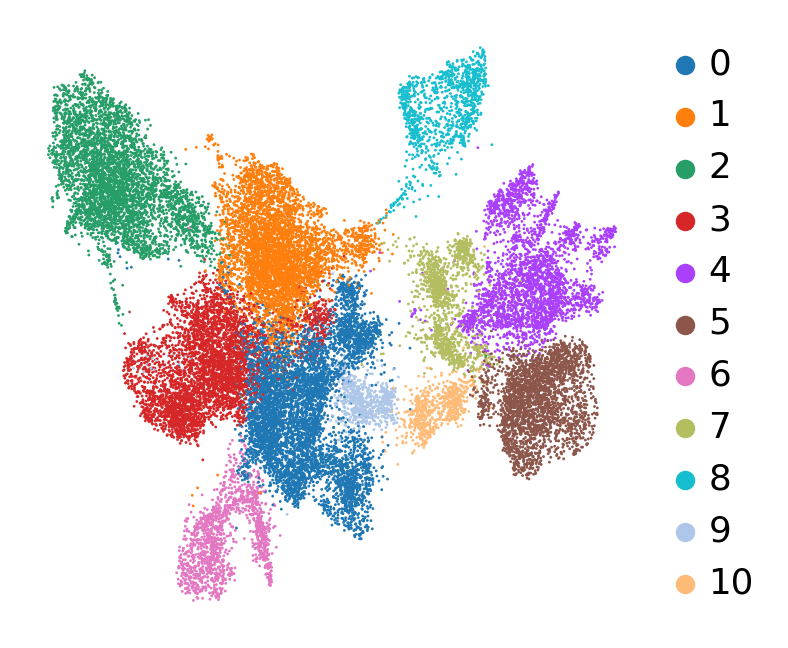

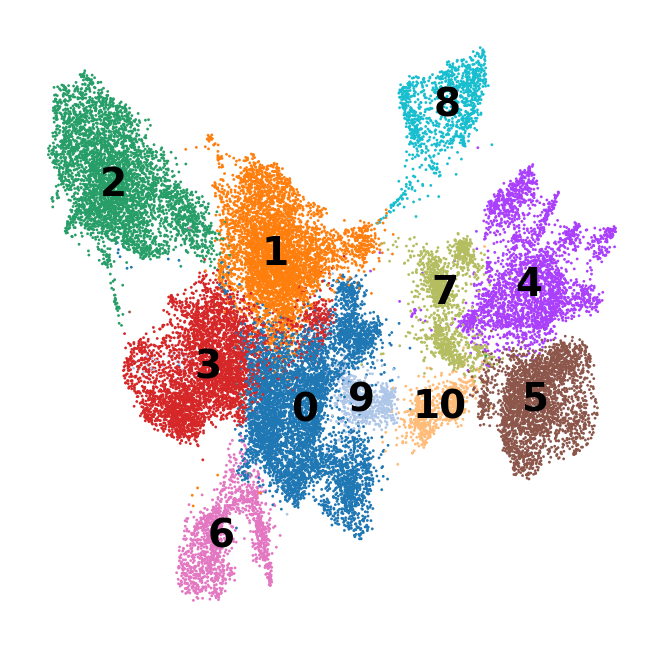

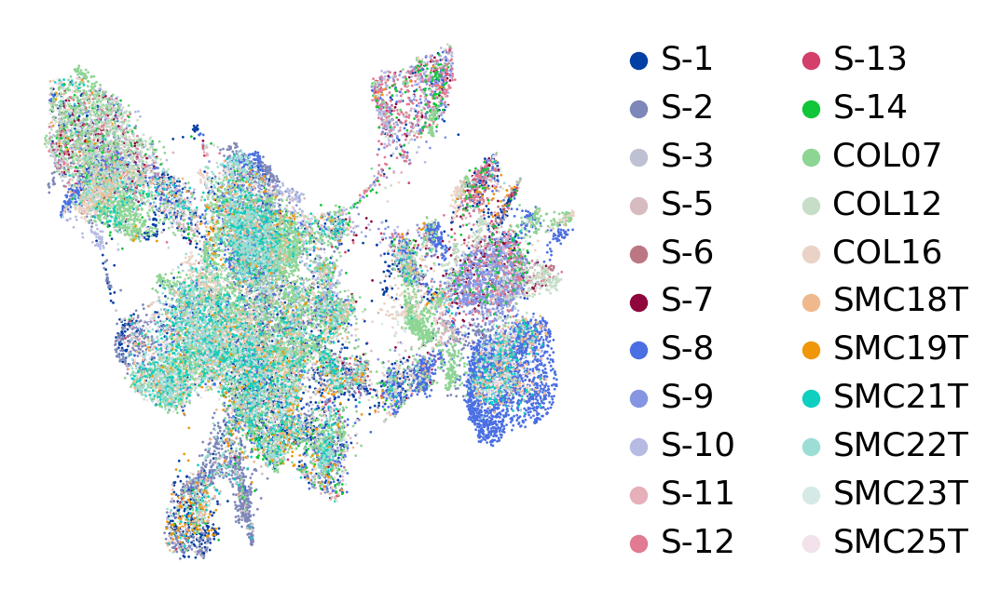

In [52]:
sc.pl.umap(adata, color=['leiden'], legend_loc='right margin', frameon=False, title='', use_raw=True)
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', frameon=False, title='', use_raw=True, save='fib_epi_leiden_0.4.pdf')
sc.pl.umap(adata, color=['batch'], legend_loc='right margin', frameon=False, title='', use_raw=True, save='fib_epi_batch.pdf')


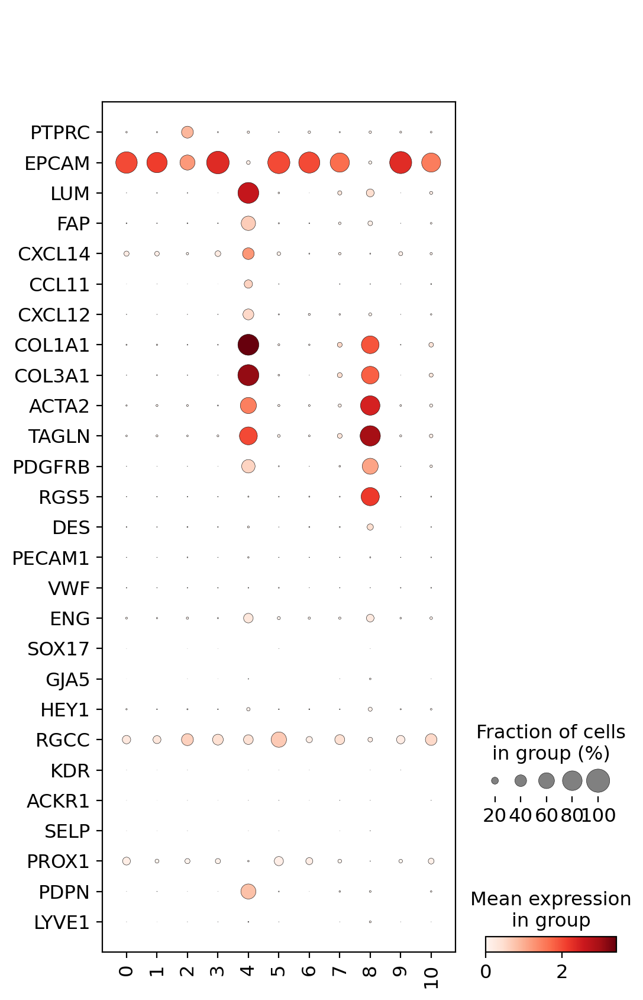

In [53]:
markers=['PTPRC','EPCAM','LUM','FAP','CXCL14','CCL11','CXCL12','COL1A1','COL3A1','ACTA2','TAGLN','PDGFRB','RGS5','DES','PECAM1', 'VWF','ENG','SOX17', 'GJA5','HEY1','RGCC','KDR','ACKR1', 'SELP','PROX1','PDPN','LYVE1']
sc.pl.dotplot(adata, var_names=markers, groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=True, dot_min=0,save='fib_epi_detail.pdf')

In [54]:
adata_fib=adata[adata.obs['leiden'].isin(["4","8"])]
adata_fib

View of AnnData object with n_obs × n_vars = 3902 × 5000
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'Fib_Epi_Cluster'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'batch_colors', 'Fib_Epi_Cluster_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [74]:
sc.pp.neighbors(adata_fib, n_neighbors=15, n_pcs=30, knn=True)
sc.tl.leiden(adata_fib, resolution=0.3)
sc.tl.umap(adata_fib)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


In [63]:
metastases_status = {
    'S-1': 'Without Metastases',
    'S-2': 'Without Metastases',
    'S-3': 'With Metastases',
    'S-5': 'With Metastases',
    'S-6': 'Without Metastases',
    'S-7': 'With Metastases',
    'S-8': 'Without Metastases',
    'S-9': 'With Metastases',
    'S-10': 'With Metastases',
    'S-11': 'Without Metastases',
    'S-12': 'Without Metastases',
    'S-13': 'With Metastases',
    'S-14': 'Without Metastases',
    'COL07': 'With Metastases',
    'COL12': 'With Metastases',
    'COL16': 'With Metastases',
    'SMC18T': 'Without Metastases',
    'SMC19T': 'Without Metastases',
    'SMC21T': 'With Metastases',
    'SMC22T': 'Without Metastases',
    'SMC23T': 'Without Metastases',
    'SMC25T': 'With Metastases',
}
adata_fib.obs['Metastases'] = adata_fib.obs['batch'].map(metastases_status)

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


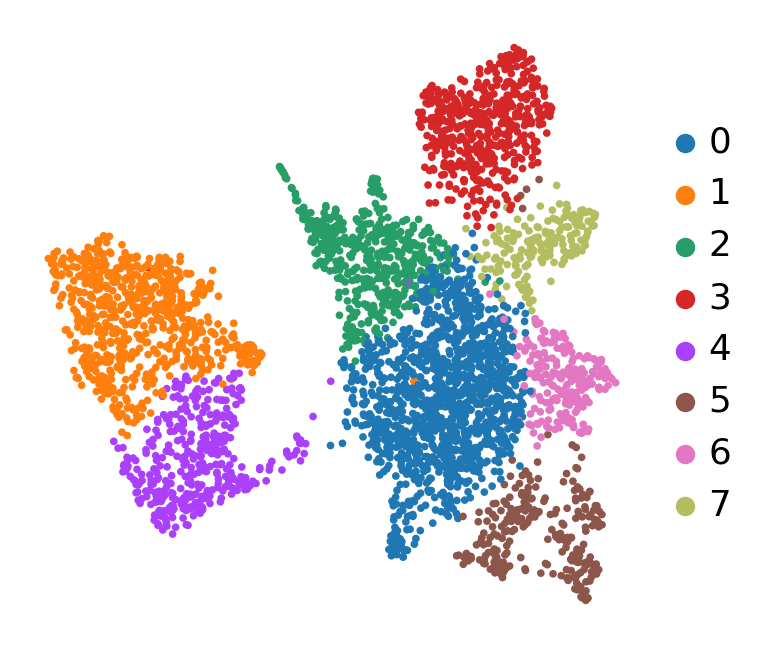

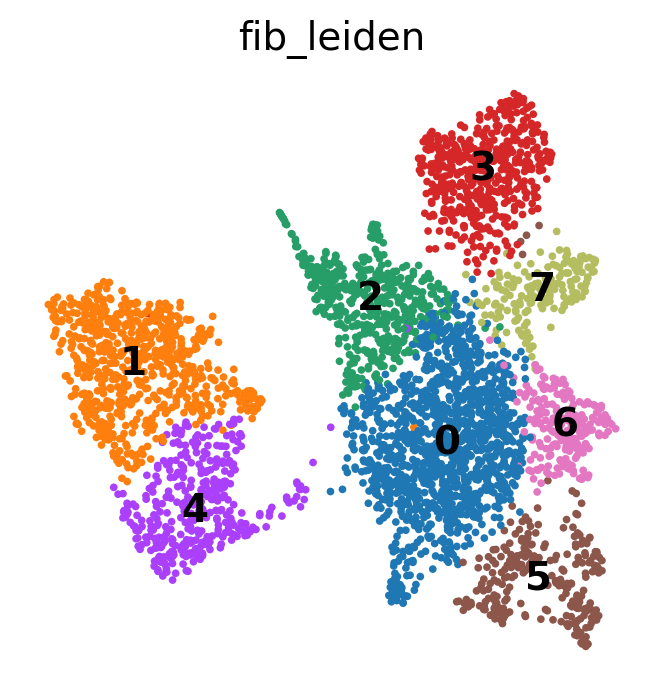

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


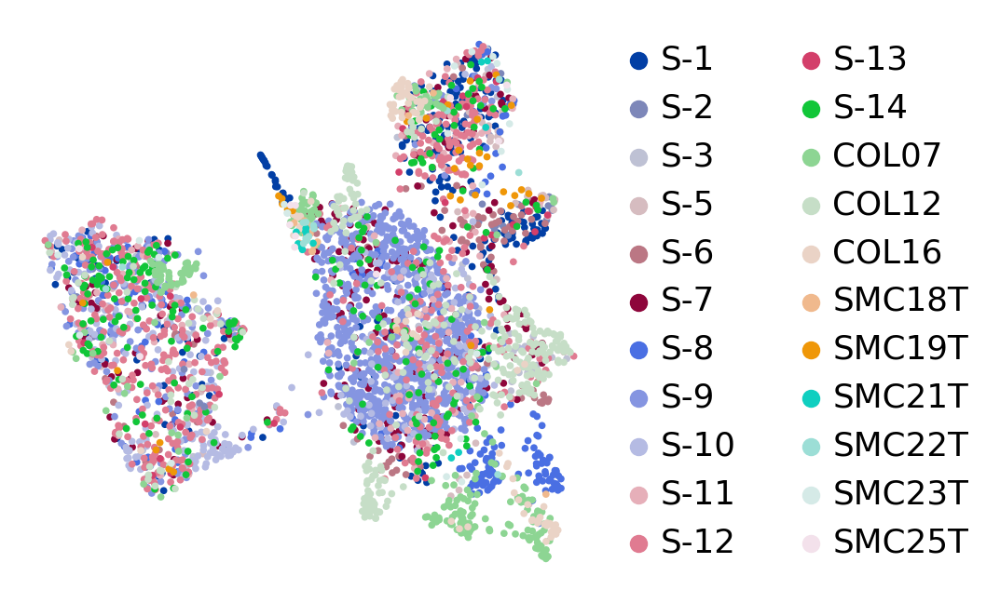

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


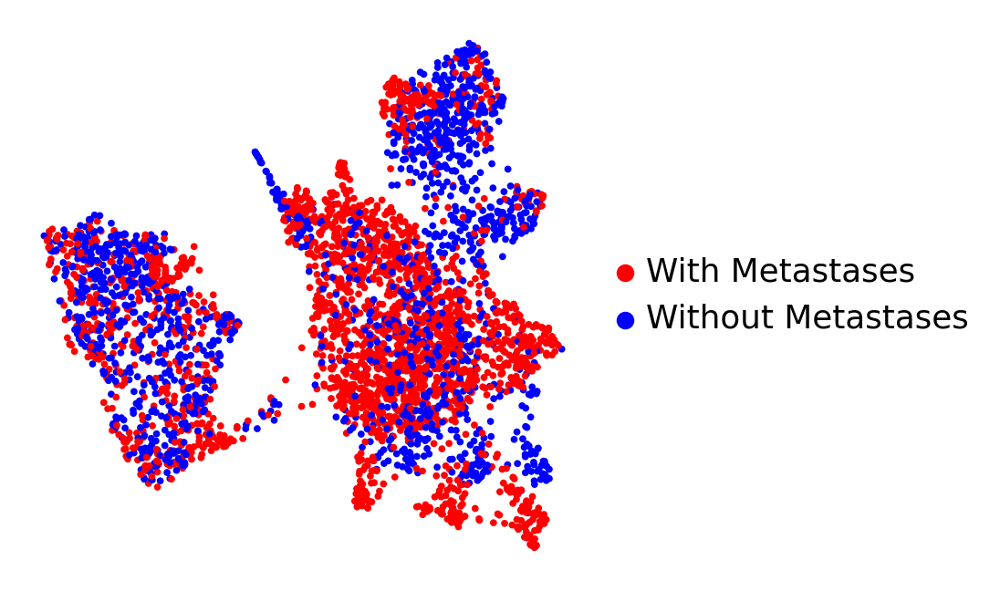

In [8]:
sc.pl.umap(adata_fib, color=['leiden'], legend_loc='right margin', frameon=False, title='', use_raw=True)
sc.pl.umap(adata_fib, color=['leiden'], legend_loc='on data', frameon=False, title='fib_leiden', use_raw=True, save='fib_leiden_0.3.pdf')
sc.pl.umap(adata_fib, color=['batch'], legend_loc='right margin', frameon=False, title='', use_raw=True, save='fib_batch_0.4.pdf')
sc.pl.umap(adata_fib, color=['Metastases'], legend_loc='right margin', frameon=False, title='', use_raw=True, palette={'Without Metastases': 'blue', 'With Metastases': 'red'}, save='fib_meta.pdf')

In [66]:
#adata_fib.write('/mnt/g/YS_work2/5.Fib_Epi/YS_fib_leiden_5000_0.4_3902.h5ad',compression='gzip')

In [2]:
adata_fib=sc.read_h5ad('/mnt/g/YS_work2/5.Fib_Epi/YS_fib_leiden_5000_0.3_3902.h5ad')

In [4]:
adata_fib

AnnData object with n_obs × n_vars = 3902 × 5000
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'Fib_Epi_Cluster', 'Metastases'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Fib_Epi_Cluster_colors', 'Metastases_colors', 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


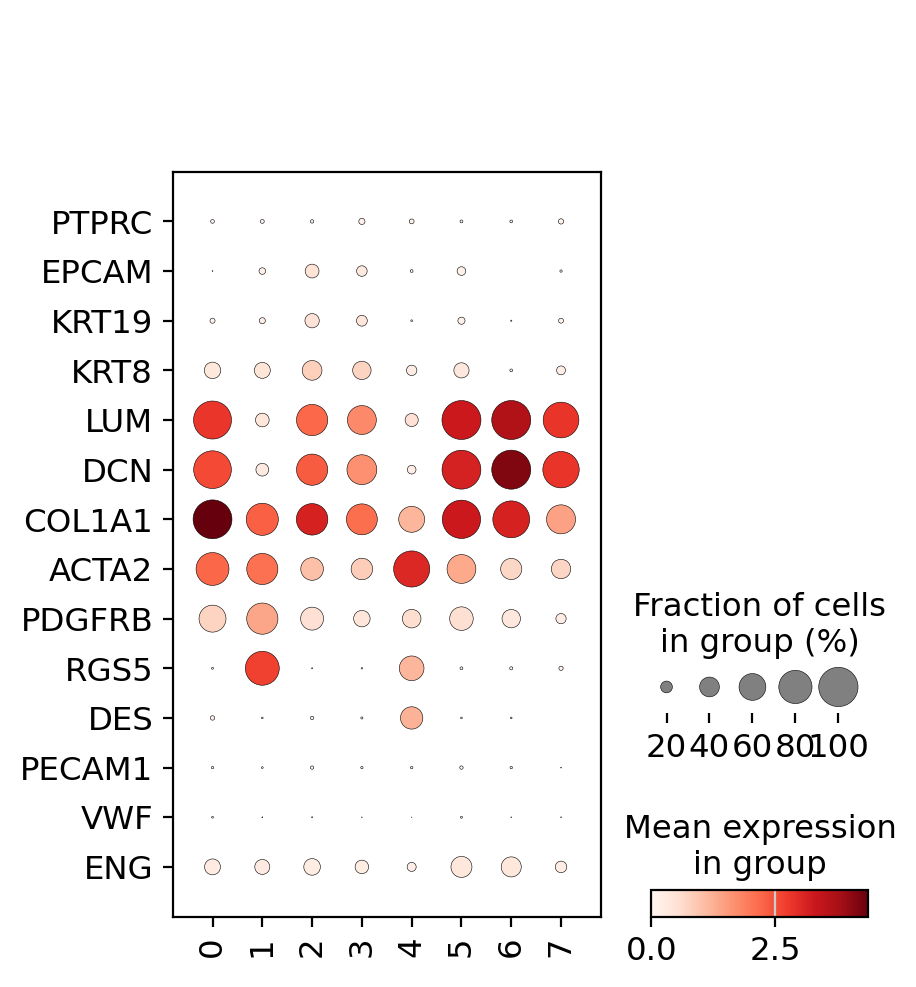

In [7]:
markers=['PTPRC','EPCAM','KRT19','KRT8','LUM','DCN','COL1A1','ACTA2','PDGFRB','RGS5','DES','PECAM1', 'VWF','ENG']
sc.pl.dotplot(adata_fib, var_names=markers, groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=True, dot_min=0,save='fib_leiden_allmarker.pdf')

In [77]:
adata_fib.uns["log1p"] = {"base": None}
sc.tl.rank_genes_groups(adata_fib, groupby='leiden', method='t-test', use_raw=False)
adata_fib.uns['rank_genes_groups']['logfoldchanges'] = adata_fib.uns['rank_genes_groups'].pop('logfoldchanges')
adata_fib.uns['rank_genes_groups']['logFC'] = adata_fib.uns['rank_genes_groups']['logfoldchanges']
result = adata_fib.uns['rank_genes_groups']
groups = result['names'].dtype.names
df=pd.DataFrame(
  {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logFC', 'pvals_adj']})
import csv
df.to_csv("YS_fib_leiden_degs_ttest.csv", quoting=csv.QUOTE_NONNUMERIC)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


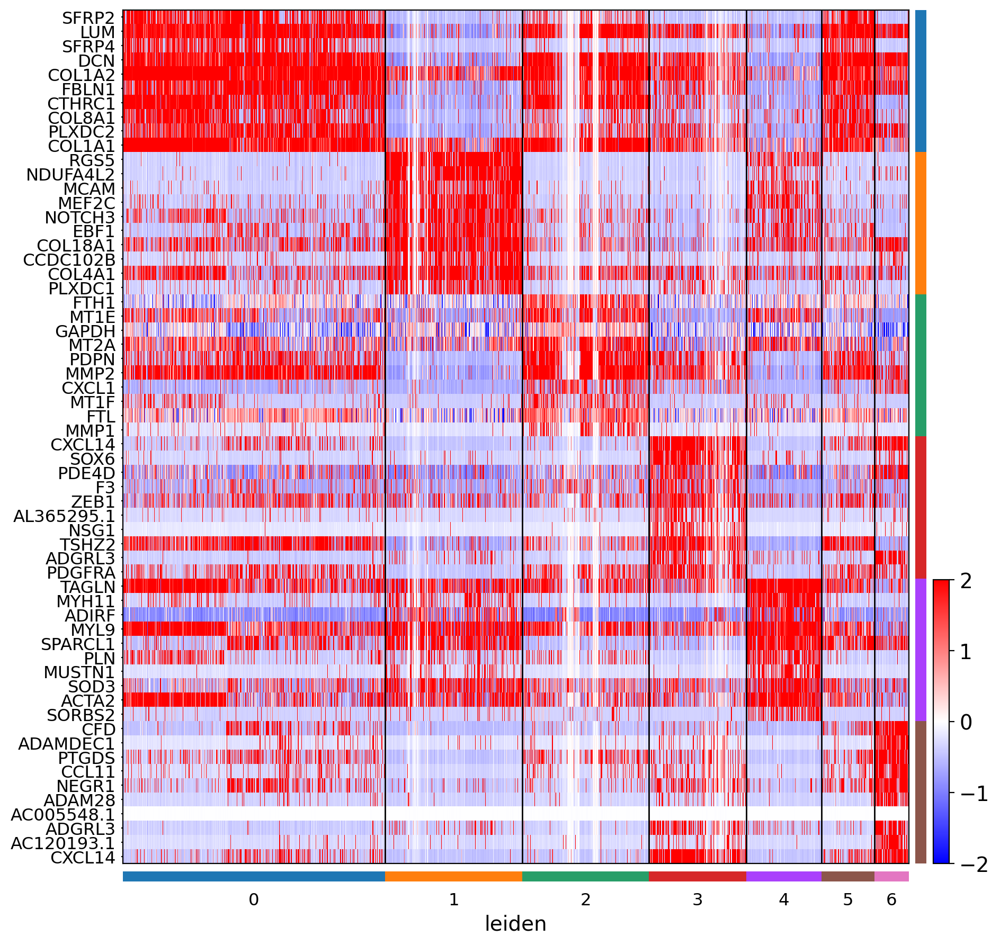

In [93]:
sc.pl.rank_genes_groups_heatmap(adata_fib, n_genes=10, groupby='leiden', use_raw=False, 
                                swap_axes=True, show_gene_labels=True, vmin=-2, vmax=2, cmap='bwr', dendrogram=False, save='fib_leiden_ttest.pdf')

In [79]:
adata_fib.uns["log1p"] = {"base": None}
sc.tl.rank_genes_groups(adata_fib, groupby='leiden', method='wilcoxon', use_raw=False)
adata_fib.uns['rank_genes_groups']['logfoldchanges'] = adata_fib.uns['rank_genes_groups'].pop('logfoldchanges')
adata_fib.uns['rank_genes_groups']['logFC'] = adata_fib.uns['rank_genes_groups']['logfoldchanges']
result = adata_fib.uns['rank_genes_groups']
groups = result['names'].dtype.names
df=pd.DataFrame(
  {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logFC', 'pvals_adj']})
import csv
df.to_csv("YS_fib_leiden_degs_wilcoxon.csv", quoting=csv.QUOTE_NONNUMERIC)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


In [36]:
adata_fib.obs.to_csv("adata_fib_obs_infor.csv",index=True)

In [39]:
#adata_fib.to_df().reset_index().to_csv("adata_fib_4106_noscaled_data.csv", index=False)

In [12]:
new_stro_names ='''
0,SFRP2+ CAFs
1,RGS5+ CAFs
2,CXCL1+ CAFs
3,CXCL14+ CAFs
4,MYH11+ CAFs
5,SFRP2+ CAFs
6,SFRP2+ CAFs
7,CCL11+ CAFs
'''

In [13]:
def labeled(
  adata: sc.AnnData, 
  cluster_names: str, 
  reference_key: str, 
  cell_type_key: str = 'CellType', 
  inplace: bool = True
  ):
  _adata = adata if inplace else adata.copy()
  _ref_df = _adata.obs.loc[:, [reference_key]]
  _annot_df = pd.read_csv(StringIO(cluster_names), header=None, dtype='object')
  _adata.obs[cell_type_key] = pd.merge(
    _ref_df, _annot_df, left_on=reference_key, right_on=0, how='left')[1].values
  return None if inplace else _adata

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


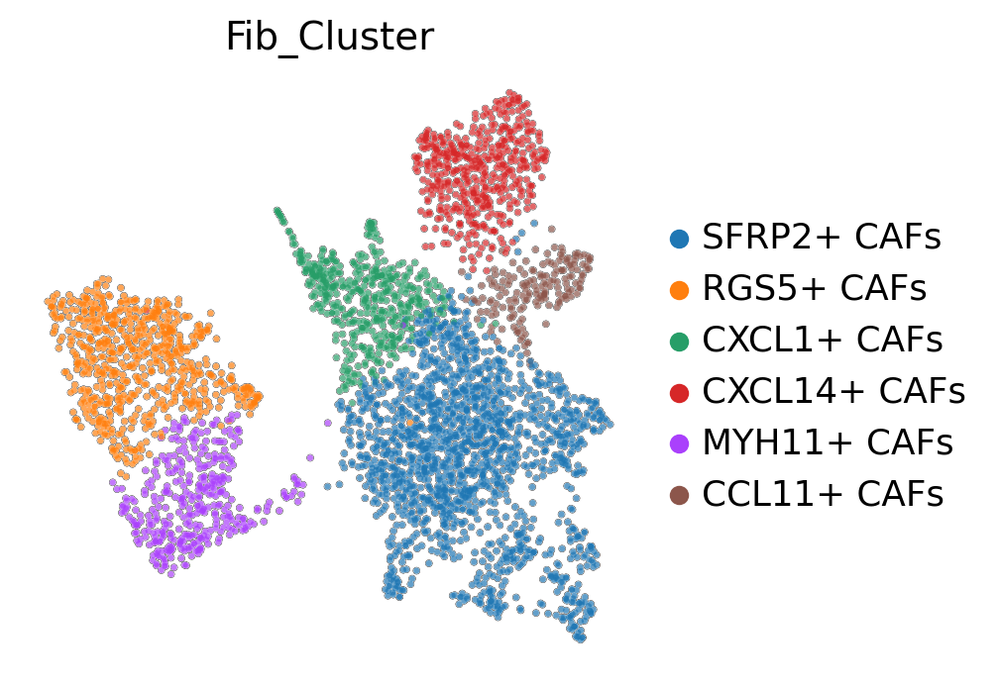

In [14]:
from io import StringIO
import pandas as pd

labeled(adata_fib,cluster_names=new_stro_names,reference_key='leiden',cell_type_key='Fib_Cluster')
adata_fib.obs['Fib_Cluster']
# 将 'Stro_RNA_Cluster' 转换为类别数据类型
adata_fib.obs['Fib_Cluster'] = adata_fib.obs['Fib_Cluster'].astype('category')

categories = adata_fib.obs['Fib_Cluster'].cat.categories
new_order = ['SFRP2+ CAFs',
'RGS5+ CAFs',
'CXCL1+ CAFs',
'CXCL14+ CAFs',
'MYH11+ CAFs',
'CCL11+ CAFs']
adata_fib.obs['Fib_Cluster'] = adata_fib.obs['Fib_Cluster'].cat.reorder_categories(new_order, ordered=True)

sc.pl.umap(adata_fib,color='Fib_Cluster',frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), size=20,
           save='Fib_Cluster_total.pdf')

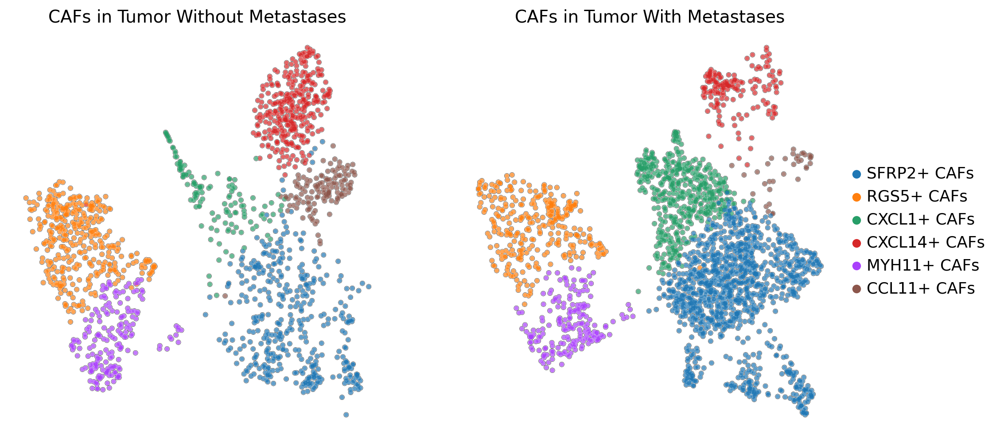

In [103]:
import scanpy as sc
import matplotlib.pyplot as plt

# Assuming you have an AnnData object named 'adata_fib'
TnM_data = adata_fib[adata_fib.obs['Metastases'] == 'Without Metastases']
TM_data = adata_fib[adata_fib.obs['Metastases'] == 'With Metastases']

# Create a new figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))

# Plot the first UMAP with a different colormap, for example, 'viridis'
sc.pl.umap(TnM_data, color=['Fib_Cluster'],
           legend_loc='', frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), size=50, use_raw=True, ax=ax1, show=False,title='CAFs in Tumor Without Metastases')

# Plot the second UMAP with a different colormap, for example, 'plasma'
sc.pl.umap(TM_data, color=['Fib_Cluster'],
           legend_loc='right margin', frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), size=50, use_raw=True, ax=ax2, show=False,title='CAFs in Tumor With Metastases')

# Save the figure as a PDF
plt.savefig('combined_umaps CAF_viridis.pdf', dpi=300, bbox_inches='tight')
plt.show()


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


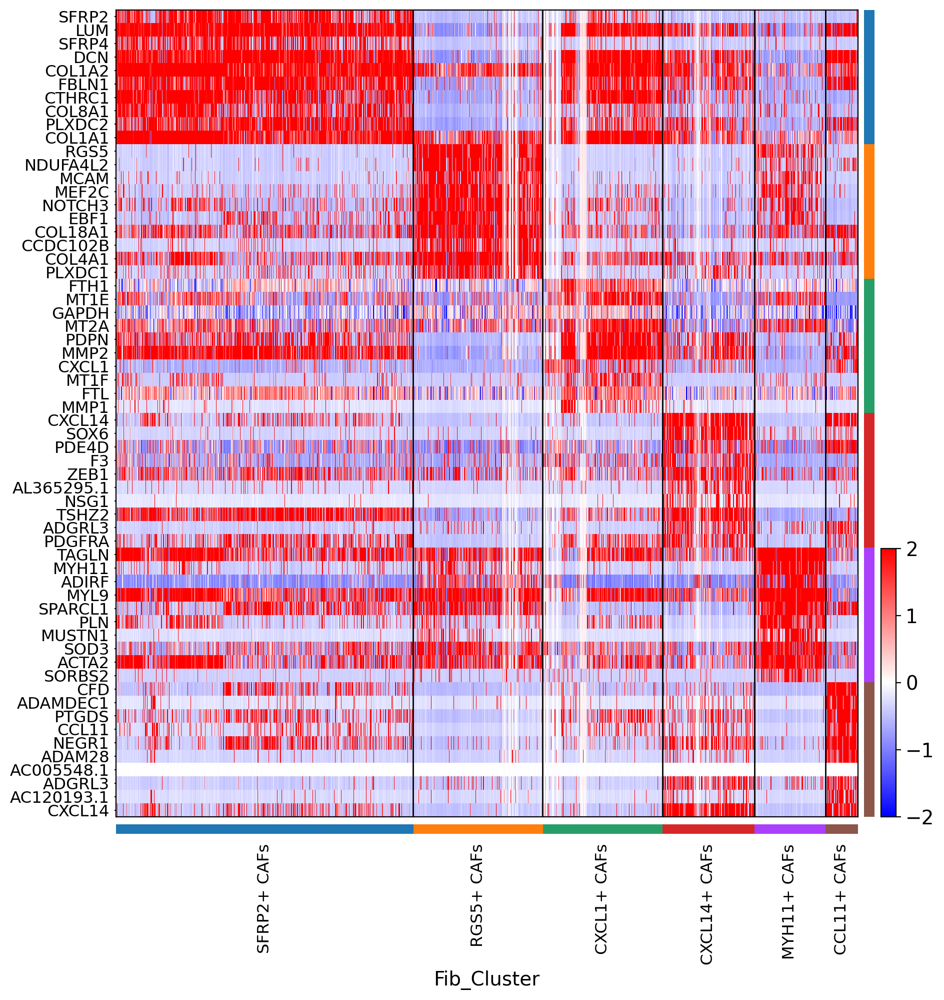

In [104]:
adata_fib.uns["log1p"] = {"base": None}
sc.tl.rank_genes_groups(adata_fib, groupby='Fib_Cluster', method='t-test', use_raw=False)
adata_fib.uns['rank_genes_groups']['logfoldchanges'] = adata_fib.uns['rank_genes_groups'].pop('logfoldchanges')
adata_fib.uns['rank_genes_groups']['logFC'] = adata_fib.uns['rank_genes_groups']['logfoldchanges']
result = adata_fib.uns['rank_genes_groups']
groups = result['names'].dtype.names
df=pd.DataFrame(
  {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logFC', 'pvals_adj']})
import csv
df.to_csv("YS_Fib_Cluster_degs_ttest.csv", quoting=csv.QUOTE_NONNUMERIC)

sc.pl.rank_genes_groups_heatmap(adata_fib, n_genes=10, groupby='Fib_Cluster', use_raw=False, 
                                swap_axes=True, show_gene_labels=True, vmin=-2, vmax=2, cmap='bwr', dendrogram=False, save='Fib_Cluster_ttest.pdf')

In [106]:
adata_fib.write('YS_fib_after_CAFcelltype_new.h5ad',compression='gzip')

In [105]:
adata_fib.obs.to_csv("adata_fib_obs_celltype_infor.csv")

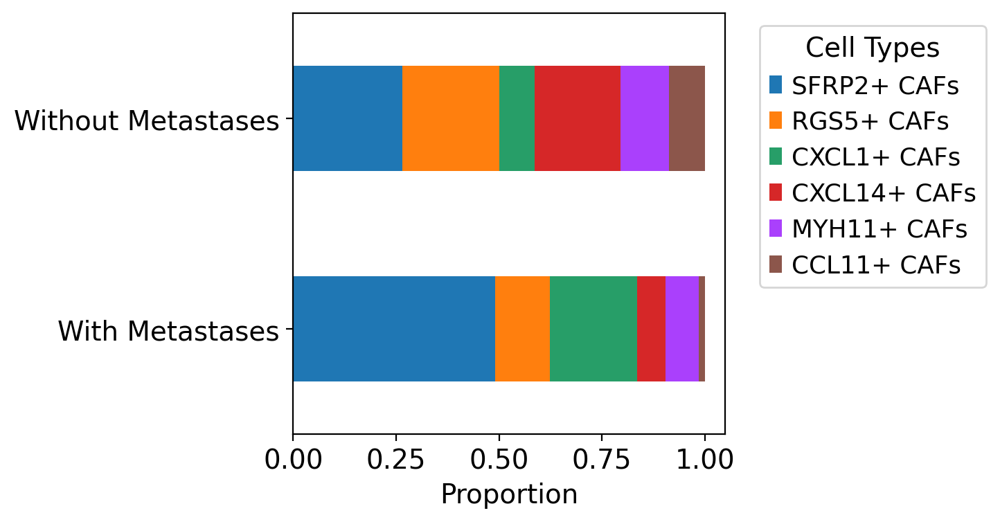

In [107]:
import pandas as pd
import matplotlib.pyplot as plt

# 从adata_stro提取数据
metastases = adata_fib.obs['Metastases']
cell_type = adata_fib.obs['Fib_Cluster']

# 创建DataFrame
df = pd.DataFrame({'Metastases': metastases, 'CellType': cell_type})

# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['Metastases', 'CellType']).size().unstack(fill_value=0)

# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)


# 绘制条形图
ax = grouped_ratios.plot.barh(stacked=True)  
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Proportion')
ax.set_ylabel('')

# 去掉网格
ax.grid(False)

# 显示图形
plt.savefig('fib_cellproportion_metastasis.pdf', dpi=300, bbox_inches='tight')
plt.show()

In [108]:
grouped_ratios.to_csv("adata_fib_cellproportion.csv")

In [109]:
grouped_counts.to_csv("adata_fib_cellcount.csv")

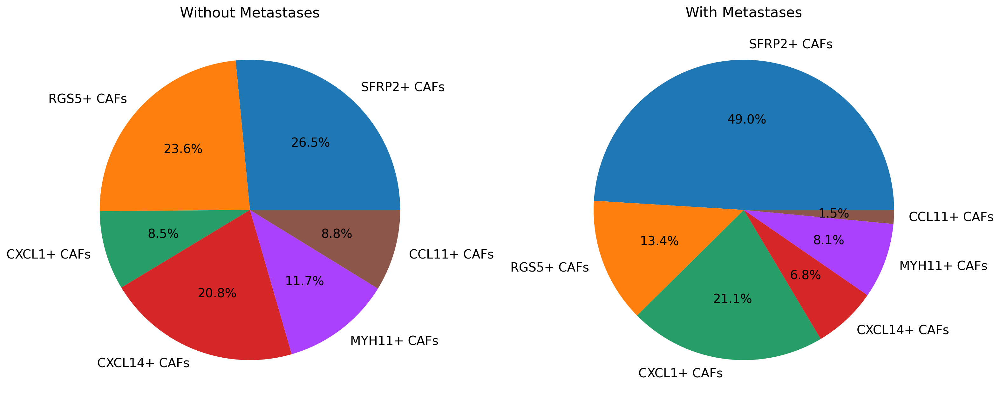

In [111]:
import pandas as pd
import matplotlib.pyplot as plt

# 读取csv文件
df = pd.read_csv('adata_fib_cellproportion.csv', index_col='Metastases')

# 对DataFrame按照索引进行排序
df.sort_index(ascending=False, inplace=True)

# 初始化图形
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# 自定义函数，决定是否显示百分比
def autopct_format(values):
    def my_format(pct):
        return ('%1.1f%%' % pct) if pct > 0.5 else ''
    return my_format

# 绘制饼图
for i, (index, row) in enumerate(df.iterrows()):
    wedges, texts, autotexts = ax[i].pie(row, labels=row.index, autopct=autopct_format(row))
    ax[i].set_title(index, fontsize=16)

# 调整图形
plt.tight_layout()

# 保存图形
plt.savefig('fib_pie_subcelltype.pdf', dpi=600, bbox_inches='tight')

# 显示图形
plt.show()


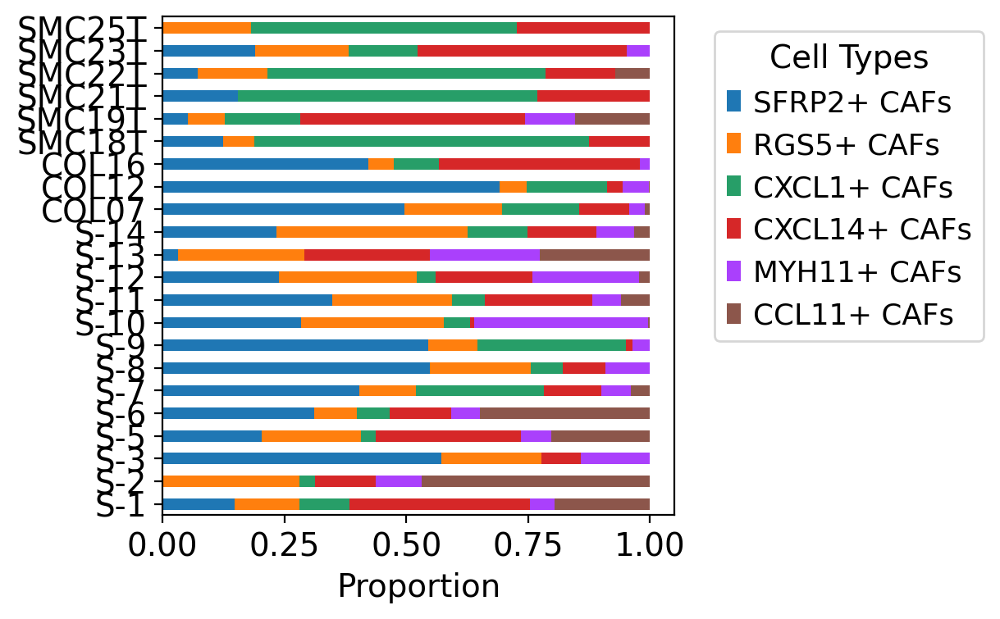

In [112]:
batch = adata_fib.obs['batch']
cell_type = adata_fib.obs['Fib_Cluster']

# 创建DataFrame
df = pd.DataFrame({'batch': batch, 'CellType': cell_type})

# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['batch', 'CellType']).size().unstack(fill_value=0)

# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)

# 绘制条形图
ax = grouped_ratios.plot.barh(stacked=True)  
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Proportion')
ax.set_ylabel('')

# 去掉网格
ax.grid(False)

# 显示图形
plt.savefig('fib_cellproportion_batch.pdf', dpi=300, bbox_inches='tight')
plt.show()

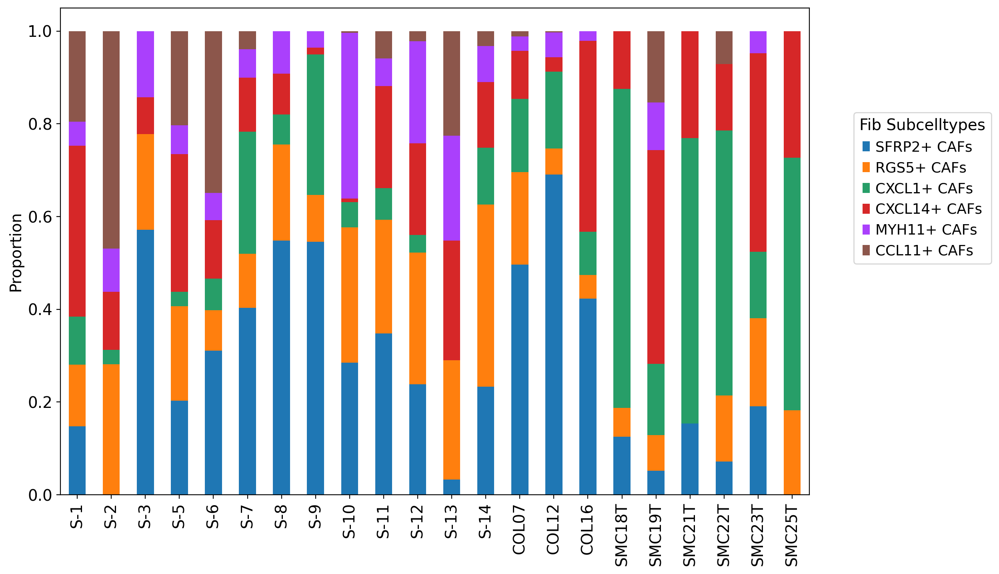

In [113]:
import pandas as pd
import matplotlib.pyplot as plt

batch = adata_fib.obs['batch']
cell_type = adata_fib.obs['Fib_Cluster']

# 创建DataFrame
df = pd.DataFrame({'batch': batch, 'CellType': cell_type})

# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['batch', 'CellType']).size().unstack(fill_value=0)

# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)

# 重新排序数据
new_order = ['S-1', 'S-2', 'S-3', 'S-5', 'S-6', 'S-7', 'S-8', 'S-9', 'S-10', 'S-11', 'S-12', 'S-13', 'S-14', 'COL07', 'COL12', 'COL16', 'SMC18T', 'SMC19T', 'SMC21T', 'SMC22T', 'SMC23T', 'SMC25T']
grouped_ratios = grouped_ratios.reindex(new_order)

# 创建图形并指定图形的大小
fig, ax = plt.subplots(figsize=(12, 8))  # 更改图形的大小，(宽度, 高度)

# 绘制堆积条形图
grouped_ratios.plot.bar(stacked=True, ax=ax)

# 设置图例和轴标签
leg = ax.legend(title='Fib Subcelltypes', bbox_to_anchor=(1.05, 0.8), loc='upper left')
for line in leg.get_lines():
    line.set_linewidth(1)  # 更改图例线条的宽度

ax.set_xlabel('')
ax.set_ylabel('Proportion')

# 去掉网格
ax.grid(False)

# 保存并显示图形
plt.savefig('fib_cellproportion_batch_polished.pdf', dpi=300, bbox_inches='tight')
plt.show()


In [114]:
grouped_ratios.to_csv("adata_fib_batch_cellproportion.csv")

In [115]:
grouped_ratios

CellType,SFRP2+ CAFs,RGS5+ CAFs,CXCL1+ CAFs,CXCL14+ CAFs,MYH11+ CAFs,CCL11+ CAFs
batch,,,,,,
S-1,0.147601,0.132841,0.103321,0.369004,0.051661,0.195572
S-2,0.000000,0.281250,0.031250,0.125000,0.093750,0.468750
S-3,0.571429,0.206349,0.000000,0.079365,0.142857,0.000000
S-5,0.203125,0.203125,0.031250,0.296875,0.062500,0.203125
S-6,0.310680,0.087379,0.067961,0.126214,0.058252,0.349515
S-7,0.403101,0.116279,0.263566,0.116279,0.062016,0.038760
S-8,0.548387,0.207373,0.064516,0.087558,0.092166,0.000000
S-9,0.545641,0.100513,0.303590,0.014359,0.035897,0.000000
S-10,0.284615,0.292308,0.053846,0.007692,0.357692,0.003846


In [116]:
df = pd.read_csv('adata_fib_cellproportion.csv', index_col=None)
df

,Metastases,SFRP2+ CAFs,RGS5+ CAFs,CXCL1+ CAFs,CXCL14+ CAFs,MYH11+ CAFs,CCL11+ CAFs
0,With Metastases,0.490221,0.133929,0.211310,0.068452,0.081207,0.014881
1,Without Metastases,0.265161,0.236129,0.085161,0.208387,0.117419,0.087742


In [117]:
adata_fib.obs['Metastases'].value_counts()

With Metastases       2352
Without Metastases    1550
Name: Metastases, dtype: int64

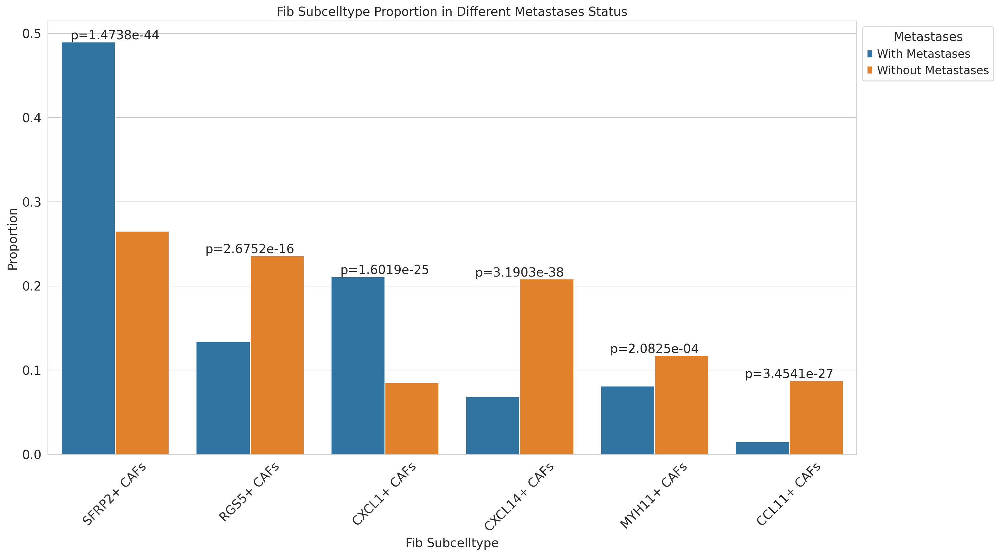

In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns

df = pd.read_csv('adata_fib_cellproportion.csv', index_col=None)
df

# 细胞数
cell_count_with_metastases = 2352
cell_count_without_metastases = 1550

cell_types = df.columns[1:]

# 进行循环计算卡方检验，并记录P值
chi2_test_p_values = []

for cell_type in cell_types:
    group_with_metastases_proportion = df.loc[df['Metastases'] == 'With Metastases', cell_type].values[0]
    group_without_metastases_proportion = df.loc[df['Metastases'] == 'Without Metastases', cell_type].values[0]

    # 计算各组的细胞数
    group_with_metastases_count = group_with_metastases_proportion * cell_count_with_metastases
    group_without_metastases_count = group_without_metastases_proportion * cell_count_without_metastases

    # 进行独立性卡方检验
    chi2_statistic, p_value_chi2, _, _ = stats.chi2_contingency([[group_with_metastases_count, cell_count_with_metastases - group_with_metastases_count],
                                                                 [group_without_metastases_count, cell_count_without_metastases - group_without_metastases_count]])

    # 将P值添加到列表中
    chi2_test_p_values.append(p_value_chi2)

# 绘制柱状图

df_melted = df.melt(id_vars='Metastases', var_name='Cell Type', value_name='Value')

# 设置绘图风格和背景色
sns.set_style("whitegrid")
plt.figure(figsize=(16, 9))

# 绘制柱状图
bar_plot = sns.barplot(x='Cell Type', y='Value', hue='Metastases', data=df_melted)

# 设置坐标轴标签和标题
plt.xlabel('Fib Subcelltype')
plt.ylabel('Proportion')
plt.title('Fib Subcelltype Proportion in Different Metastases Status')

# 调整 x 轴标签的角度
plt.xticks(rotation=45)

# 调整图例位置
plt.legend(title='Metastases', bbox_to_anchor=(1, 1), loc='upper left')

for i, p_value in enumerate(chi2_test_p_values):
    max_value = df_melted[df_melted['Cell Type'] == cell_types[i]]['Value'].max() 
    plt.text(i, max_value, f"p={p_value:.4e}", ha="center", va="bottom")
# 调整布局并保存图像
plt.tight_layout()
plt.savefig("barplot_cell_proportion_pvalues_by_metastases.pdf")
plt.show()


In [16]:
import scanpy as sc

# Assuming adata_sub2 is your preprocessed AnnData object

# Load your Hallmark gmt file and parse it into a dictionary where keys are the pathway names and values are the gene lists
# Assuming you have a function named load_gmt that does this
def load_gmt(filename):
    with open(filename, 'r') as f:
        lines = f.readlines()
    
    hallmark_dict = {}
    for line in lines:
        # Split the line into parts
        parts = line.strip().split('\t')
        
        # The first part is the pathway name
        pathway = parts[0]
        
        # Remove 'HALLMARK_' from the pathway name
        pathway = pathway.replace('HALLMARK_', '')
        
        # The rest are the genes
        genes = parts[1:]
        
        # Add to dictionary
        hallmark_dict[pathway] = genes

    return hallmark_dict


hallmark_dict = load_gmt("h.all.v2023.1.Hs.symbols.gmt")

# Loop over the dictionary
for pathway in hallmark_dict:
    # Get the gene list for the current pathway
    gene_list = hallmark_dict[pathway]
    
    # Compute the score for this pathway
    sc.tl.score_genes(adata_fib, gene_list=gene_list, score_name=pathway, use_raw=True)


computing score 'TNFA_SIGNALING_VIA_NFKB'
    finished: added
    'TNFA_SIGNALING_VIA_NFKB', score of gene set (adata.obs).
    690 total control genes are used. (0:00:00)
computing score 'HYPOXIA'
    finished: added
    'HYPOXIA', score of gene set (adata.obs).
    944 total control genes are used. (0:00:00)
computing score 'CHOLESTEROL_HOMEOSTASIS'
    finished: added
    'CHOLESTEROL_HOMEOSTASIS', score of gene set (adata.obs).
    599 total control genes are used. (0:00:00)
computing score 'MITOTIC_SPINDLE'
    finished: added
    'MITOTIC_SPINDLE', score of gene set (adata.obs).
    640 total control genes are used. (0:00:00)
computing score 'WNT_BETA_CATENIN_SIGNALING'
    finished: added
    'WNT_BETA_CATENIN_SIGNALING', score of gene set (adata.obs).
    649 total control genes are used. (0:00:00)
computing score 'TGF_BETA_SIGNALING'
    finished: added
    'TGF_BETA_SIGNALING', score of gene set (adata.obs).
    448 total control genes are used. (0:00:00)
computing score 'IL6

    finished: added
    'MYC_TARGETS_V1', score of gene set (adata.obs).
    544 total control genes are used. (0:00:00)
computing score 'MYC_TARGETS_V2'
    finished: added
    'MYC_TARGETS_V2', score of gene set (adata.obs).
    547 total control genes are used. (0:00:00)
computing score 'EPITHELIAL_MESENCHYMAL_TRANSITION'
    finished: added
    'EPITHELIAL_MESENCHYMAL_TRANSITION', score of gene set (adata.obs).
    593 total control genes are used. (0:00:00)
computing score 'INFLAMMATORY_RESPONSE'
    finished: added
    'INFLAMMATORY_RESPONSE', score of gene set (adata.obs).
    893 total control genes are used. (0:00:00)
computing score 'XENOBIOTIC_METABOLISM'
    finished: added
    'XENOBIOTIC_METABOLISM', score of gene set (adata.obs).
    995 total control genes are used. (0:00:00)
computing score 'FATTY_ACID_METABOLISM'
    finished: added
    'FATTY_ACID_METABOLISM', score of gene set (adata.obs).
    897 total control genes are used. (0:00:00)
computing score 'OXIDATIVE_PH

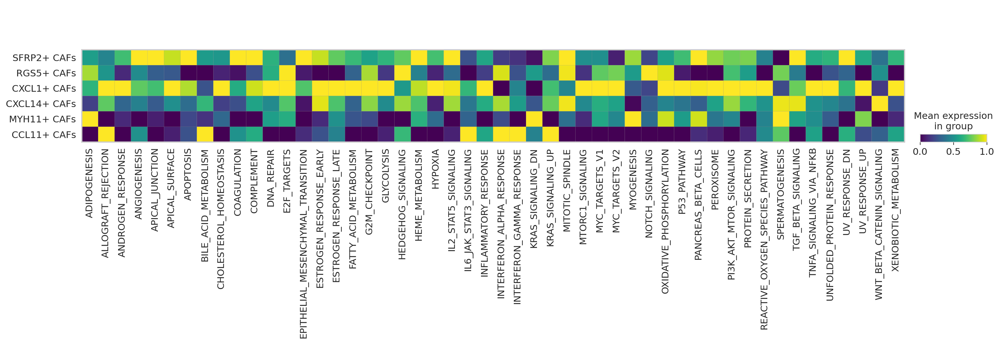

In [121]:
sc.pl.matrixplot(adata_fib, var_names=['ADIPOGENESIS', 'ALLOGRAFT_REJECTION', 'ANDROGEN_RESPONSE', 'ANGIOGENESIS', 'APICAL_JUNCTION', 'APICAL_SURFACE', 'APOPTOSIS', 'BILE_ACID_METABOLISM', 'CHOLESTEROL_HOMEOSTASIS', 'COAGULATION', 'COMPLEMENT', 'DNA_REPAIR', 'E2F_TARGETS', 'EPITHELIAL_MESENCHYMAL_TRANSITION', 'ESTROGEN_RESPONSE_EARLY', 'ESTROGEN_RESPONSE_LATE', 'FATTY_ACID_METABOLISM', 'G2M_CHECKPOINT', 'GLYCOLYSIS', 'HEDGEHOG_SIGNALING', 'HEME_METABOLISM', 'HYPOXIA', 'IL2_STAT5_SIGNALING', 'IL6_JAK_STAT3_SIGNALING', 'INFLAMMATORY_RESPONSE', 'INTERFERON_ALPHA_RESPONSE', 'INTERFERON_GAMMA_RESPONSE', 'KRAS_SIGNALING_DN', 'KRAS_SIGNALING_UP', 'MITOTIC_SPINDLE', 'MTORC1_SIGNALING', 'MYC_TARGETS_V1', 'MYC_TARGETS_V2', 'MYOGENESIS', 'NOTCH_SIGNALING', 'OXIDATIVE_PHOSPHORYLATION', 'P53_PATHWAY', 'PANCREAS_BETA_CELLS', 'PEROXISOME', 'PI3K_AKT_MTOR_SIGNALING', 'PROTEIN_SECRETION', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'SPERMATOGENESIS', 'TGF_BETA_SIGNALING', 'TNFA_SIGNALING_VIA_NFKB', 'UNFOLDED_PROTEIN_RESPONSE', 'UV_RESPONSE_DN', 'UV_RESPONSE_UP', 'WNT_BETA_CATENIN_SIGNALING', 'XENOBIOTIC_METABOLISM'], groupby='Fib_Cluster', use_raw=True, dendrogram=False, cmap='viridis', standard_scale='var', swap_axes=False, save='fib_hallmarks.pdf')

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


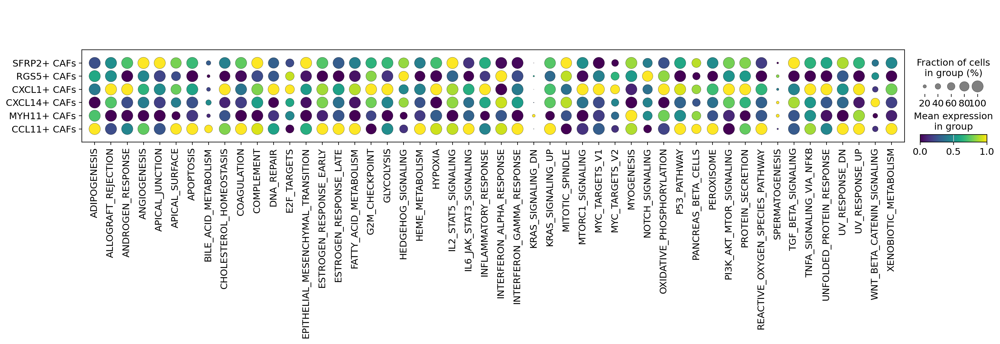

In [17]:
sc.pl.dotplot(adata_fib, var_names=['ADIPOGENESIS', 'ALLOGRAFT_REJECTION', 'ANDROGEN_RESPONSE', 'ANGIOGENESIS', 'APICAL_JUNCTION', 'APICAL_SURFACE', 'APOPTOSIS', 'BILE_ACID_METABOLISM', 'CHOLESTEROL_HOMEOSTASIS', 'COAGULATION', 'COMPLEMENT', 'DNA_REPAIR', 'E2F_TARGETS', 'EPITHELIAL_MESENCHYMAL_TRANSITION', 'ESTROGEN_RESPONSE_EARLY', 'ESTROGEN_RESPONSE_LATE', 'FATTY_ACID_METABOLISM', 'G2M_CHECKPOINT', 'GLYCOLYSIS', 'HEDGEHOG_SIGNALING', 'HEME_METABOLISM', 'HYPOXIA', 'IL2_STAT5_SIGNALING', 'IL6_JAK_STAT3_SIGNALING', 'INFLAMMATORY_RESPONSE', 'INTERFERON_ALPHA_RESPONSE', 'INTERFERON_GAMMA_RESPONSE', 'KRAS_SIGNALING_DN', 'KRAS_SIGNALING_UP', 'MITOTIC_SPINDLE', 'MTORC1_SIGNALING', 'MYC_TARGETS_V1', 'MYC_TARGETS_V2', 'MYOGENESIS', 'NOTCH_SIGNALING', 'OXIDATIVE_PHOSPHORYLATION', 'P53_PATHWAY', 'PANCREAS_BETA_CELLS', 'PEROXISOME', 'PI3K_AKT_MTOR_SIGNALING', 'PROTEIN_SECRETION', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'SPERMATOGENESIS', 'TGF_BETA_SIGNALING', 'TNFA_SIGNALING_VIA_NFKB', 'UNFOLDED_PROTEIN_RESPONSE', 'UV_RESPONSE_DN', 'UV_RESPONSE_UP', 'WNT_BETA_CATENIN_SIGNALING', 'XENOBIOTIC_METABOLISM'], groupby='Fib_Cluster', use_raw=True, dendrogram=False,cmap='viridis', standard_scale="var" ,swap_axes=False, save='fib_hallmarks.pdf')

In [18]:
adata_fib.write('YS_fib_after_CAFcelltype_new_after_hallmarks.h5ad',compression='gzip')

In [131]:
adata.obs['Fib_Epi_Cluster']

AAACCTGGTTACTGAC-1-S-1         COL11A1+ CAFs
AAAGCAATCCCATTTA-1-S-1         COL11A1+ CAFs
AACACGTGTGCTTCTC-1-S-1           CCL11+ CAFs
AACCGCGAGTGTCCCG-1-S-1          CXCL14+ CAFs
AACTCCCTCAGCTCGG-1-S-1         COL11A1+ CAFs
                                  ...       
TTTGCGCCATGGAATA-1-SMC25T    Malignant_EPCs1
TTTGCGCCATGTTCCC-1-SMC25T    Malignant_EPCs3
TTTGGTTGTAGGGTAC-1-SMC25T    Malignant_EPCs1
TTTGTCAAGAGGGATA-1-SMC25T    Malignant_EPCs1
TTTGTCATCCCAAGTA-1-SMC25T    Malignant_EPCs5
Name: Fib_Epi_Cluster, Length: 29545, dtype: category
Categories (13, object): ['CCL11+ CAFs', 'COL11A1+ CAFs', 'CXCL5+ CAFs', 'CXCL14+ CAFs', ..., 'Malignant_EPCs3', 'Malignant_EPCs4', 'Malignant_EPCs5', 'RGS5+ CAFs']

In [132]:
adata_fib.obs['Fib_Cluster']

AAACCTGGTTACTGAC-1-S-1        SFRP2+ CAFs
AAAGCAATCCCATTTA-1-S-1        SFRP2+ CAFs
AACACGTGTGCTTCTC-1-S-1        CCL11+ CAFs
AACCGCGAGTGTCCCG-1-S-1       CXCL14+ CAFs
AACTCCCTCAGCTCGG-1-S-1        SFRP2+ CAFs
                                 ...     
ATTATCCTCCGCATAA-1-SMC25T     CXCL1+ CAFs
CAACCAACAGCTCGCA-1-SMC25T     CXCL1+ CAFs
CAGAATCCAATAGCGG-1-SMC25T     CXCL1+ CAFs
CAGCTAAAGCCCAGCT-1-SMC25T     CXCL1+ CAFs
TCTCTAACATCGTCGG-1-SMC25T     CXCL1+ CAFs
Name: Fib_Cluster, Length: 3902, dtype: category
Categories (6, object): ['SFRP2+ CAFs' < 'RGS5+ CAFs' < 'CXCL1+ CAFs' < 'CXCL14+ CAFs' < 'MYH11+ CAFs' < 'CCL11+ CAFs']

In [133]:
# 创建一个字典，将 'Fib_Cluster' 和 'Fib_Epi_Cluster' 的对应关系存储起来
mapping_dict = dict(zip(adata_fib.obs_names, adata_fib.obs['Fib_Cluster']))

# 使用 map 函数将 'Fib_Epi_Cluster' 列的值替换为对应的 'Fib_Cluster' 的值
adata.obs['Fib_Epi_Cluster'] = adata.obs_names.map(mapping_dict)


In [134]:
adata.obs['Fib_Epi_Cluster']

AAACCTGGTTACTGAC-1-S-1        SFRP2+ CAFs
AAAGCAATCCCATTTA-1-S-1        SFRP2+ CAFs
AACACGTGTGCTTCTC-1-S-1        CCL11+ CAFs
AACCGCGAGTGTCCCG-1-S-1       CXCL14+ CAFs
AACTCCCTCAGCTCGG-1-S-1        SFRP2+ CAFs
                                 ...     
TTTGCGCCATGGAATA-1-SMC25T             NaN
TTTGCGCCATGTTCCC-1-SMC25T             NaN
TTTGGTTGTAGGGTAC-1-SMC25T             NaN
TTTGTCAAGAGGGATA-1-SMC25T             NaN
TTTGTCATCCCAAGTA-1-SMC25T             NaN
Name: Fib_Epi_Cluster, Length: 29545, dtype: object

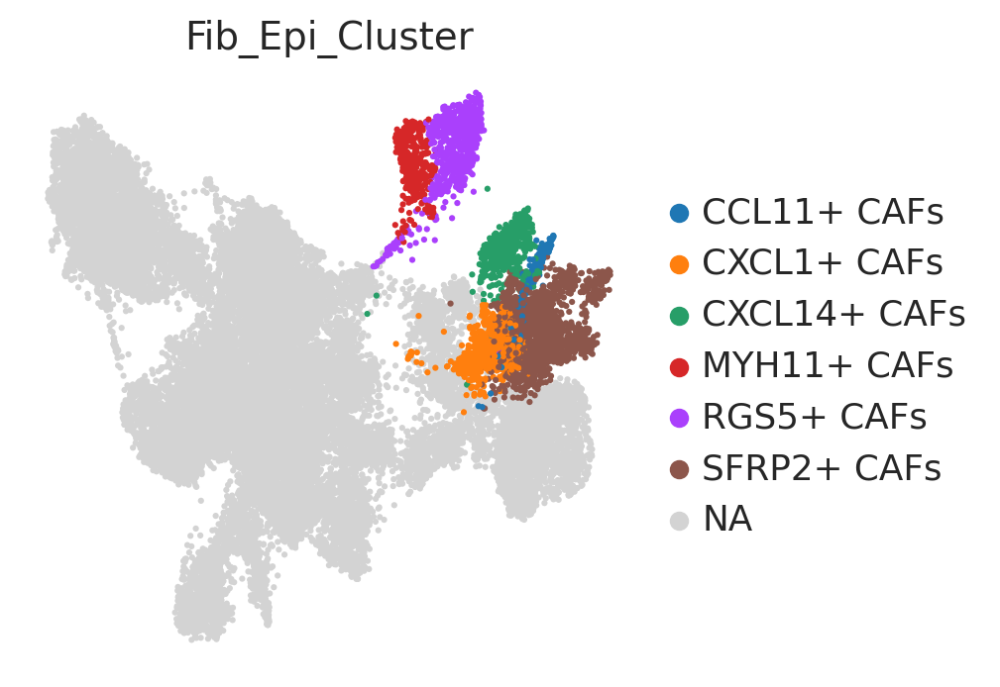

In [135]:
adata.obs['Fib_Epi_Cluster'] = adata.obs['Fib_Epi_Cluster'].astype('category')

sc.pl.umap(adata,color='Fib_Epi_Cluster',frameon=False, add_outline=False,
           outline_width=(0.05, 0.05), size=20,
           save='Fib_Epi_Cluster_only_fib.pdf')

In [137]:
valid_numbers = [str(x) for x in range(11) if x !=4 and x!=8]
print(valid_numbers)
adata_epi=adata[adata.obs['leiden'].isin(valid_numbers)]
adata_epi

['0', '1', '2', '3', '5', '6', '7', '9', '10']


View of AnnData object with n_obs × n_vars = 25643 × 5000
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'Fib_Epi_Cluster'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'batch_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
metastases_status = {
    'S-1': 'Without Metastases',
    'S-2': 'Without Metastases',
    'S-3': 'With Metastases',
    'S-5': 'With Metastases',
    'S-6': 'Without Metastases',
    'S-7': 'With Metastases',
    'S-8': 'Without Metastases',
    'S-9': 'With Metastases',
    'S-10': 'With Metastases',
    'S-11': 'Without Metastases',
    'S-12': 'Without Metastases',
    'S-13': 'With Metastases',
    'S-14': 'Without Metastases',
    'COL07': 'With Metastases',
    'COL12': 'With Metastases',
    'COL16': 'With Metastases',
    'SMC18T': 'Without Metastases',
    'SMC19T': 'Without Metastases',
    'SMC21T': 'With Metastases',
    'SMC22T': 'Without Metastases',
    'SMC23T': 'Without Metastases',
    'SMC25T': 'With Metastases',
}
adata_epi.obs['Metastases'] = adata_epi.obs['batch'].map(metastases_status)

In [165]:
sc.pp.neighbors(adata_epi, n_neighbors=15, n_pcs=30, knn=True)
sc.tl.leiden(adata_epi, resolution=0.4)
sc.tl.umap(adata_epi)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:25)


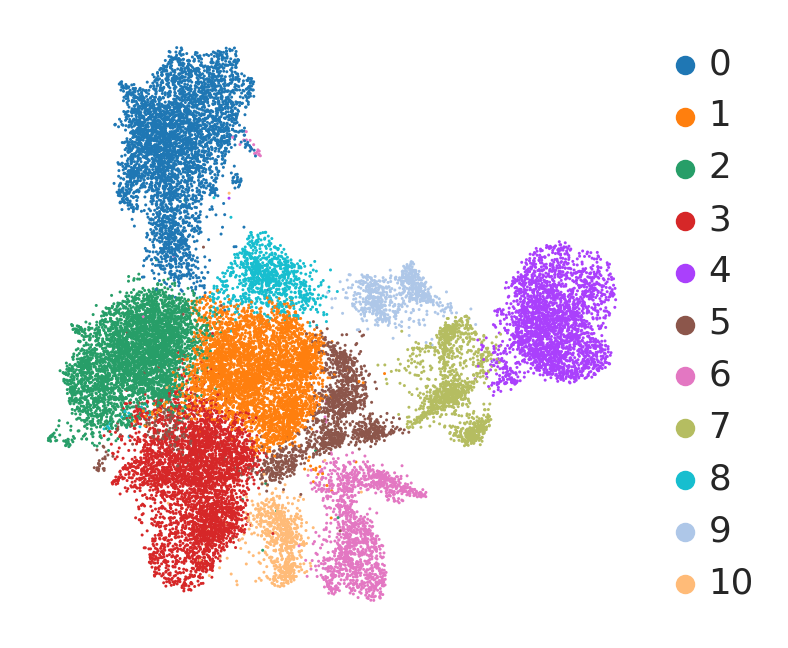

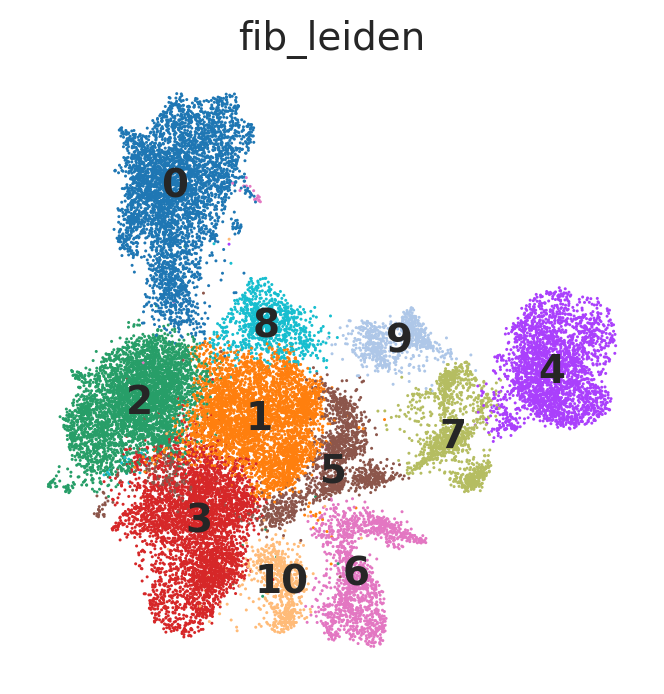

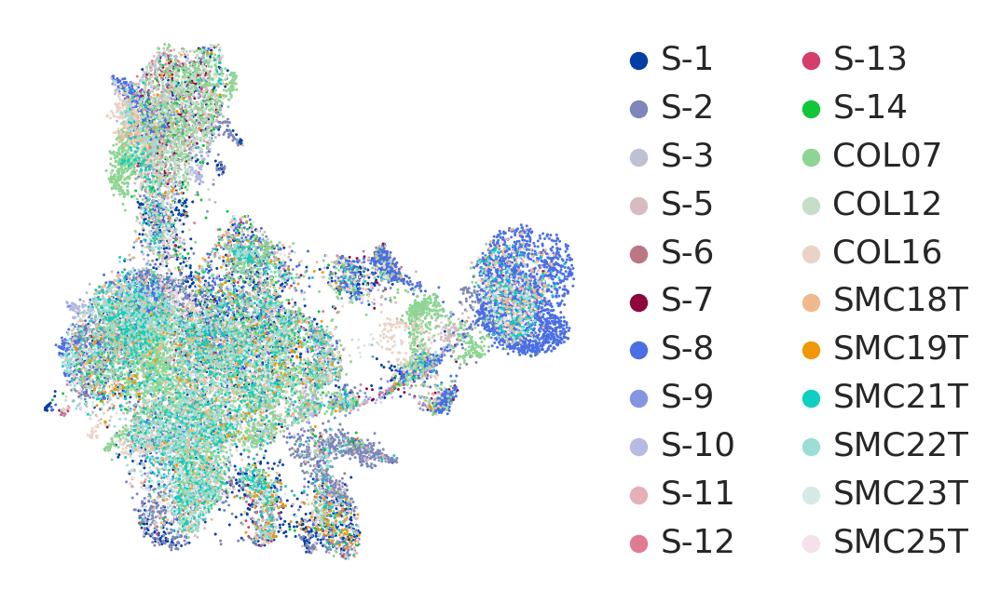

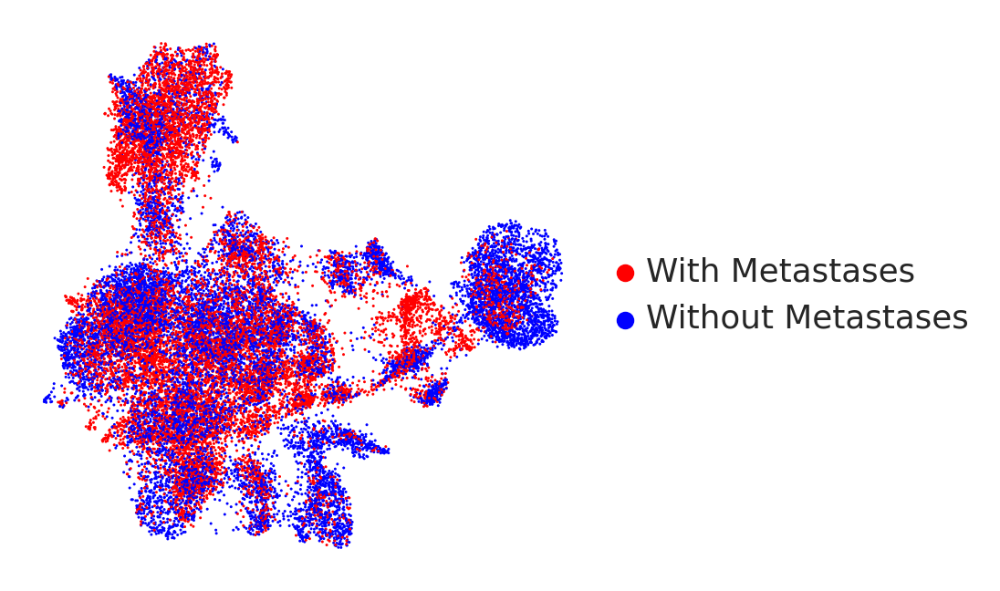

In [167]:
sc.pl.umap(adata_epi, color=['leiden'], legend_loc='right margin', frameon=False, title='', use_raw=True)
sc.pl.umap(adata_epi, color=['leiden'], legend_loc='on data', frameon=False, title='fib_leiden', use_raw=True, save='epi_leiden_0.4_15_30.pdf')
sc.pl.umap(adata_epi, color=['batch'], legend_loc='right margin', frameon=False, title='', use_raw=True, save='epi_batch_0.4.pdf')
sc.pl.umap(adata_epi, color=['Metastases'], legend_loc='right margin', frameon=False, title='', use_raw=True, palette={'Without Metastases': 'blue', 'With Metastases': 'red'}, save='epi_meta.pdf')

In [157]:
#adata_epi.write('/mnt/g/YS_work2/5.Fib_Epi/YS_epi_leiden_5000_0.4_25643.h5ad',compression='gzip')

In [158]:
adata_epi=sc.read_h5ad('/mnt/g/YS_work2/5.Fib_Epi/YS_epi_leiden_5000_0.4_25643.h5ad')

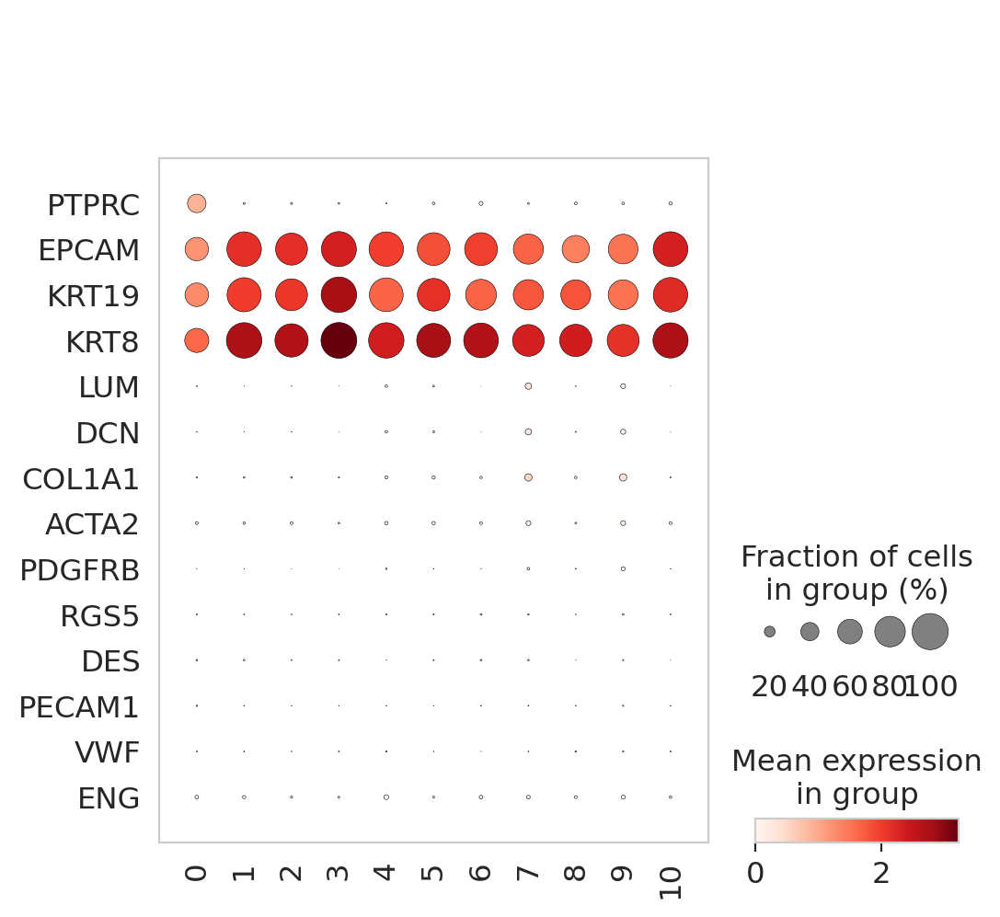

In [159]:
markers=['PTPRC','EPCAM','KRT19','KRT8','LUM','DCN','COL1A1','ACTA2','PDGFRB','RGS5','DES','PECAM1', 'VWF','ENG']
sc.pl.dotplot(adata_epi, var_names=markers, groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=True, dot_min=0,save='fib_leiden_allmarker.pdf')

In [160]:
adata_epi.uns["log1p"] = {"base": None}
sc.tl.rank_genes_groups(adata_epi, groupby='leiden', method='t-test', use_raw=False)
adata_epi.uns['rank_genes_groups']['logfoldchanges'] = adata_epi.uns['rank_genes_groups'].pop('logfoldchanges')
adata_epi.uns['rank_genes_groups']['logFC'] = adata_epi.uns['rank_genes_groups']['logfoldchanges']
result = adata_epi.uns['rank_genes_groups']
groups = result['names'].dtype.names
df=pd.DataFrame(
  {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logFC', 'pvals_adj']})
import csv
df.to_csv("YS_epi_leiden_degs_ttest.csv", quoting=csv.QUOTE_NONNUMERIC)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


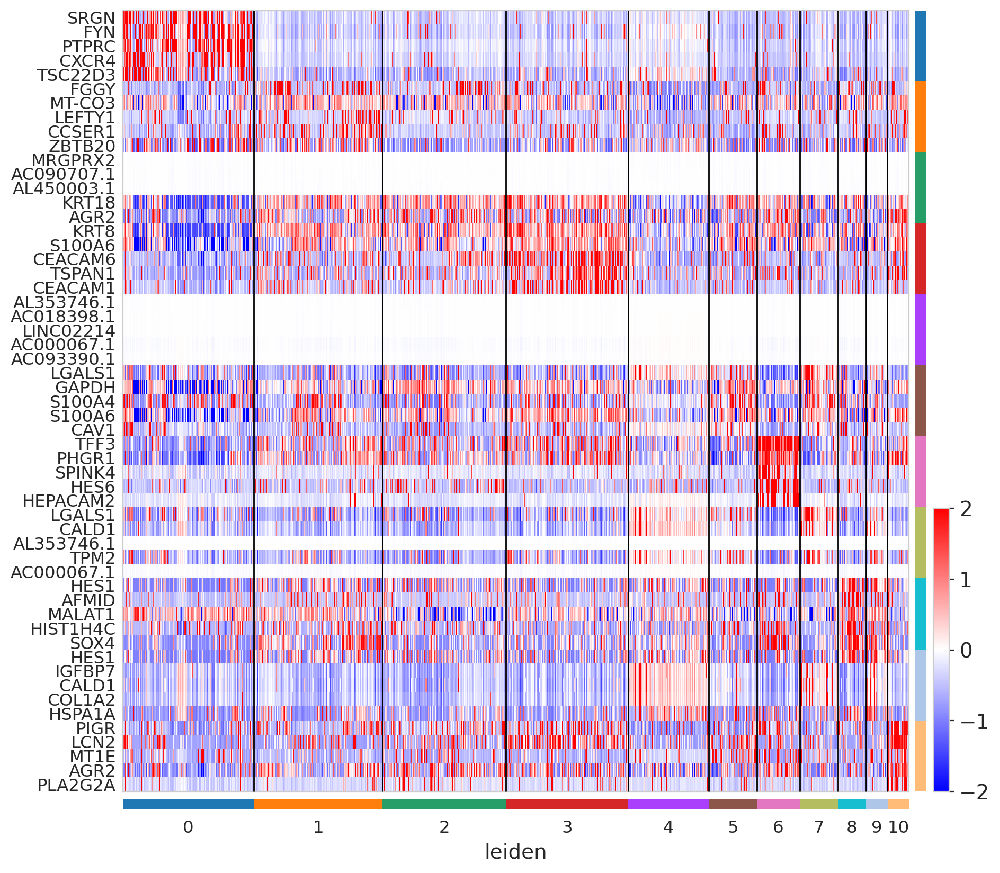

In [162]:
sc.pl.rank_genes_groups_heatmap(adata_epi, n_genes=5, groupby='leiden', use_raw=False, 
                                swap_axes=True, show_gene_labels=True, vmin=-2, vmax=2, cmap='bwr', dendrogram=False, save='epi_leiden_ttest.pdf')

In [79]:
adata_epi.uns["log1p"] = {"base": None}
sc.tl.rank_genes_groups(adata_epi, groupby='leiden', method='wilcoxon', use_raw=False)
adata_epi.uns['rank_genes_groups']['logfoldchanges'] = adata_epi.uns['rank_genes_groups'].pop('logfoldchanges')
adata_epi.uns['rank_genes_groups']['logFC'] = adata_epi.uns['rank_genes_groups']['logfoldchanges']
result = adata_epi.uns['rank_genes_groups']
groups = result['names'].dtype.names
df=pd.DataFrame(
  {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logFC', 'pvals_adj']})
import csv
df.to_csv("YS_fib_leiden_degs_wilcoxon.csv", quoting=csv.QUOTE_NONNUMERIC)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


In [36]:
adata_epi.obs.to_csv("adata_epi_obs_infor.csv",index=True)

In [39]:
#adata_epi.to_df().reset_index().to_csv("adata_epi_4106_noscaled_data.csv", index=False)

In [211]:
new_stro_names ='''
0,Malignant EPCs1
1,Malignant EPCs2
2,Malignant EPCs3
3,Malignant EPCs4
4,Malignant EPCs5
5,Malignant EPCs6
6,Malignant EPCs7
7,Malignant EPCs8
8,Malignant EPCs9
9,Malignant EPCs10
10,Malignant EPCs11
'''

In [212]:
def labeled(
  adata: sc.AnnData, 
  cluster_names: str, 
  reference_key: str, 
  cell_type_key: str = 'CellType', 
  inplace: bool = True
  ):
  _adata = adata if inplace else adata.copy()
  _ref_df = _adata.obs.loc[:, [reference_key]]
  _annot_df = pd.read_csv(StringIO(cluster_names), header=None, dtype='object')
  _adata.obs[cell_type_key] = pd.merge(
    _ref_df, _annot_df, left_on=reference_key, right_on=0, how='left')[1].values
  return None if inplace else _adata

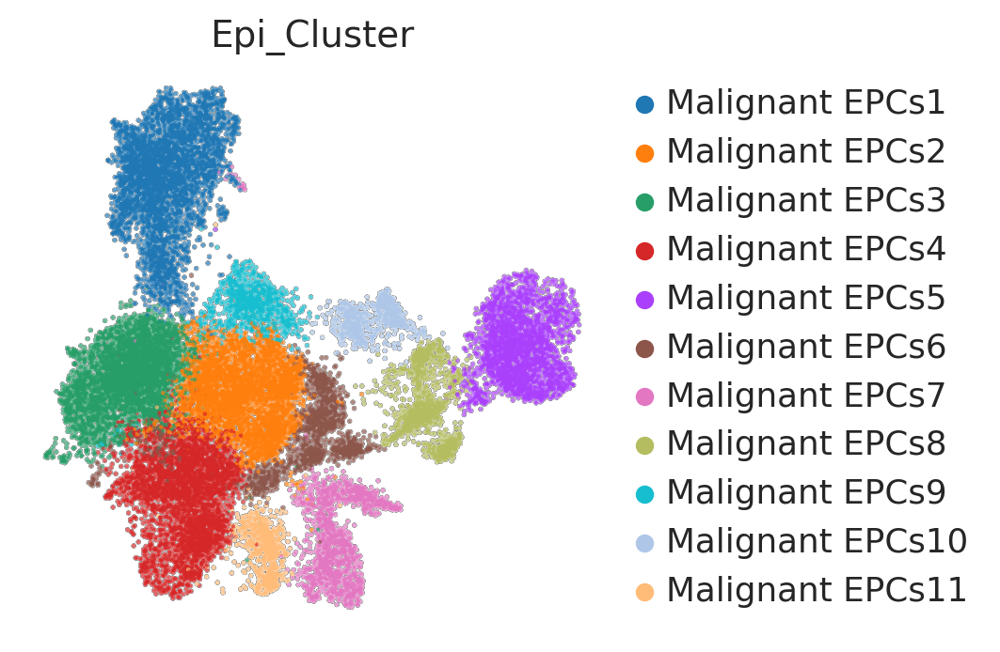

In [214]:
from io import StringIO
import pandas as pd

labeled(adata_epi,cluster_names=new_stro_names,reference_key='leiden',cell_type_key='Epi_Cluster')
adata_epi.obs['Epi_Cluster']
# 将 'Stro_RNA_Cluster' 转换为类别数据类型
adata_epi.obs['Epi_Cluster'] = adata_epi.obs['Epi_Cluster'].astype('category')

categories = adata_epi.obs['Epi_Cluster'].cat.categories
new_order = ['Malignant EPCs1',
'Malignant EPCs2',
'Malignant EPCs3',
'Malignant EPCs4',
'Malignant EPCs5',
'Malignant EPCs6',
'Malignant EPCs7',
'Malignant EPCs8',
'Malignant EPCs9',
'Malignant EPCs10',
'Malignant EPCs11']
adata_epi.obs['Epi_Cluster'] = adata_epi.obs['Epi_Cluster'].cat.reorder_categories(new_order, ordered=True)

sc.pl.umap(adata_epi,color='Epi_Cluster',frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), size=10,
           save='Epi_Cluster_total.pdf')

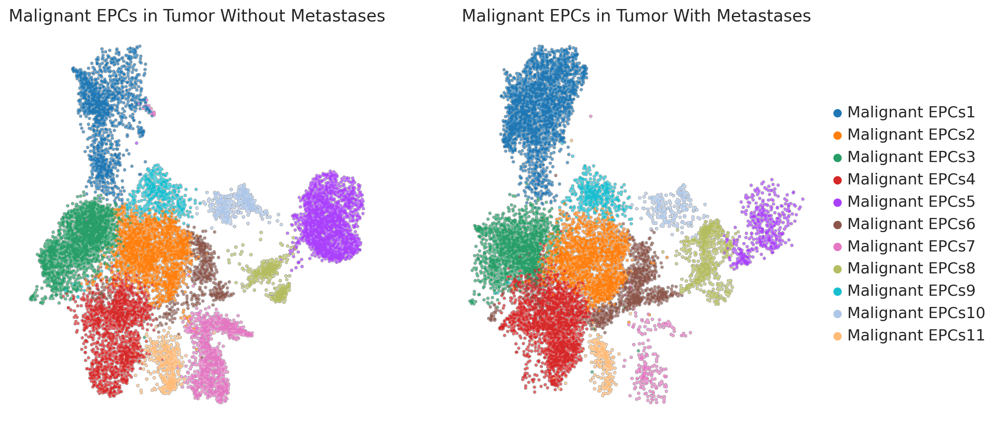

In [216]:
import scanpy as sc
import matplotlib.pyplot as plt

# Assuming you have an AnnData object named 'adata_epi'
TnM_data = adata_epi[adata_epi.obs['Metastases'] == 'Without Metastases']
TM_data = adata_epi[adata_epi.obs['Metastases'] == 'With Metastases']

# Create a new figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))

# Plot the first UMAP with a different colormap, for example, 'viridis'
sc.pl.umap(TnM_data, color=['Epi_Cluster'],
           legend_loc='', frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), size=20, use_raw=True, ax=ax1, show=False,title='Malignant EPCs in Tumor Without Metastases')

# Plot the second UMAP with a different colormap, for example, 'plasma'
sc.pl.umap(TM_data, color=['Epi_Cluster'],
           legend_loc='right margin', frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), size=20, use_raw=True, ax=ax2, show=False,title='Malignant EPCs in Tumor With Metastases')

# Save the figure as a PDF
plt.savefig('combined_umaps Malignant EPCs.pdf', dpi=300, bbox_inches='tight')
plt.show()


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


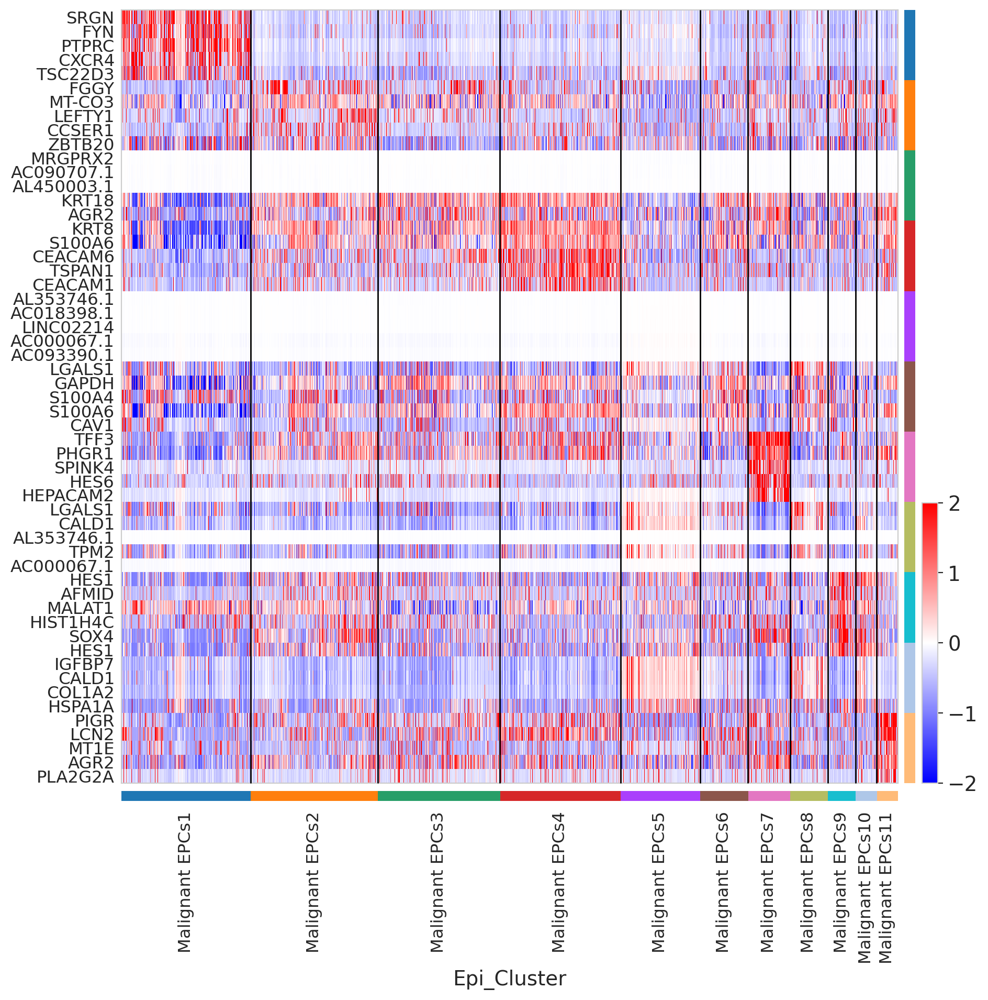

In [217]:
adata_epi.uns["log1p"] = {"base": None}
sc.tl.rank_genes_groups(adata_epi, groupby='Epi_Cluster', method='t-test', use_raw=False)
adata_epi.uns['rank_genes_groups']['logfoldchanges'] = adata_epi.uns['rank_genes_groups'].pop('logfoldchanges')
adata_epi.uns['rank_genes_groups']['logFC'] = adata_epi.uns['rank_genes_groups']['logfoldchanges']
result = adata_epi.uns['rank_genes_groups']
groups = result['names'].dtype.names
df=pd.DataFrame(
  {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logFC', 'pvals_adj']})
import csv
df.to_csv("YS_Epi_Cluster_degs_ttest.csv", quoting=csv.QUOTE_NONNUMERIC)

sc.pl.rank_genes_groups_heatmap(adata_epi, n_genes=5, groupby='Epi_Cluster', use_raw=False, 
                                swap_axes=True, show_gene_labels=True, vmin=-2, vmax=2, cmap='bwr', dendrogram=False, save='Epi_Cluster_ttest.pdf')

In [218]:
adata_epi.write('YS_epi_after_Malcelltype_new_11.h5ad',compression='gzip')

In [219]:
adata_epi.obs.to_csv("adata_epi_obs_celltype_infor_11Cluster.csv")

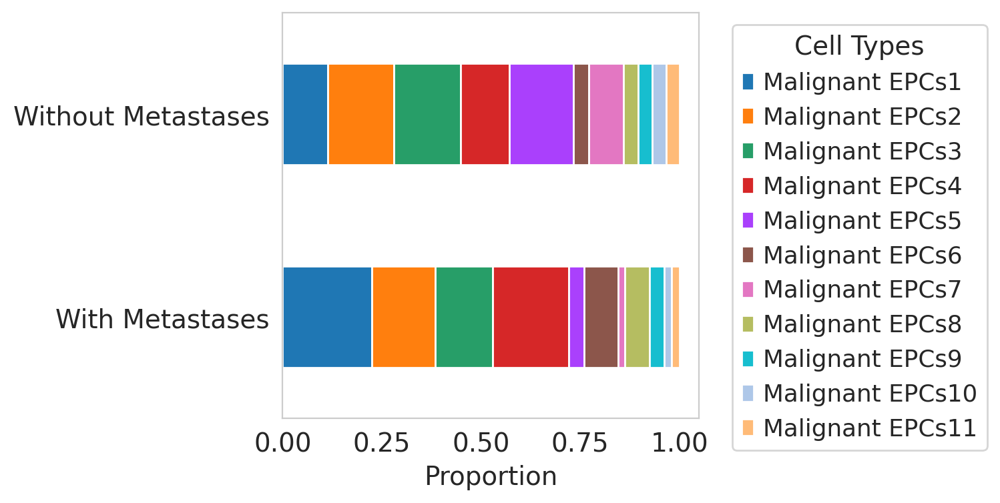

In [222]:
import pandas as pd
import matplotlib.pyplot as plt

# 从adata_stro提取数据
metastases = adata_epi.obs['Metastases']
cell_type = adata_epi.obs['Epi_Cluster']

# 创建DataFrame
df = pd.DataFrame({'Metastases': metastases, 'CellType': cell_type})

# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['Metastases', 'CellType']).size().unstack(fill_value=0)

# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)


# 绘制条形图
ax = grouped_ratios.plot.barh(stacked=True)  
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Proportion')
ax.set_ylabel('')

# 去掉网格
ax.grid(False)

# 显示图形
plt.savefig('Epi_cellproportion_metastasis.pdf', dpi=300, bbox_inches='tight')
plt.show()

In [223]:
grouped_ratios.to_csv("adata_epi_cellproportion.csv")

In [224]:
grouped_counts.to_csv("adata_epi_cellcount.csv")
grouped_counts

CellType,Malignant EPCs1,Malignant EPCs2,Malignant EPCs3,Malignant EPCs4,Malignant EPCs5,Malignant EPCs6,Malignant EPCs7,Malignant EPCs8,Malignant EPCs9,Malignant EPCs10,Malignant EPCs11
Metastases,,,,,,,,,,,
With Metastases,2762,1988,1787,2360,472,1061,209,771,443,241,240
Without Metastases,1505,2218,2243,1628,2150,525,1175,481,472,459,453


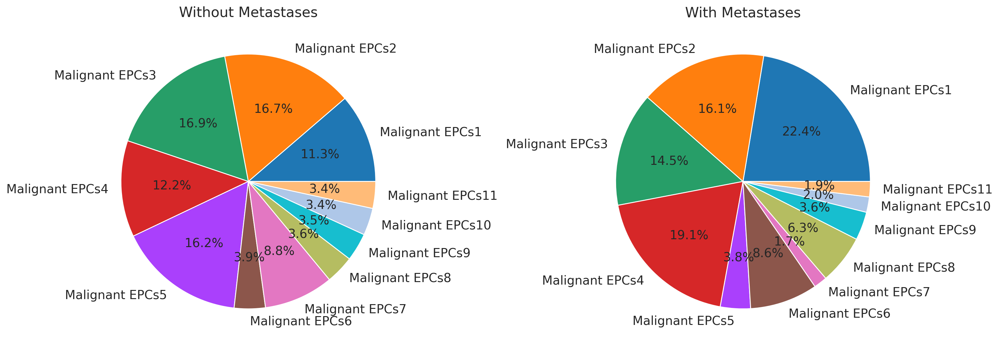

In [226]:
import pandas as pd
import matplotlib.pyplot as plt

# 读取csv文件
df = pd.read_csv('adata_epi_cellproportion.csv', index_col='Metastases')

# 对DataFrame按照索引进行排序
df.sort_index(ascending=False, inplace=True)

# 初始化图形
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# 自定义函数，决定是否显示百分比
def autopct_format(values):
    def my_format(pct):
        return ('%1.1f%%' % pct) if pct > 0.5 else ''
    return my_format

# 绘制饼图
for i, (index, row) in enumerate(df.iterrows()):
    wedges, texts, autotexts = ax[i].pie(row, labels=row.index, autopct=autopct_format(row))
    ax[i].set_title(index, fontsize=16)

# 调整图形
plt.tight_layout()

# 保存图形
plt.savefig('Epi_pie_subcelltype.pdf', dpi=600, bbox_inches='tight')

# 显示图形
plt.show()


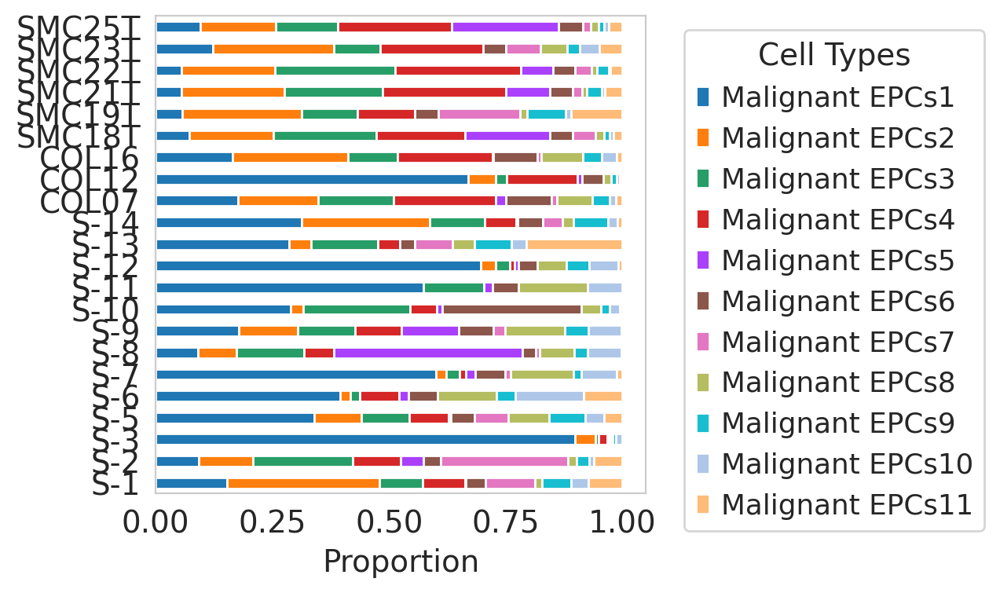

In [227]:
batch = adata_epi.obs['batch']
cell_type = adata_epi.obs['Epi_Cluster']

# 创建DataFrame
df = pd.DataFrame({'batch': batch, 'CellType': cell_type})

# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['batch', 'CellType']).size().unstack(fill_value=0)

# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)

# 绘制条形图
ax = grouped_ratios.plot.barh(stacked=True)  
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Proportion')
ax.set_ylabel('')

# 去掉网格
ax.grid(False)

# 显示图形
plt.savefig('Epi_cellproportion_batch.pdf', dpi=300, bbox_inches='tight')
plt.show()

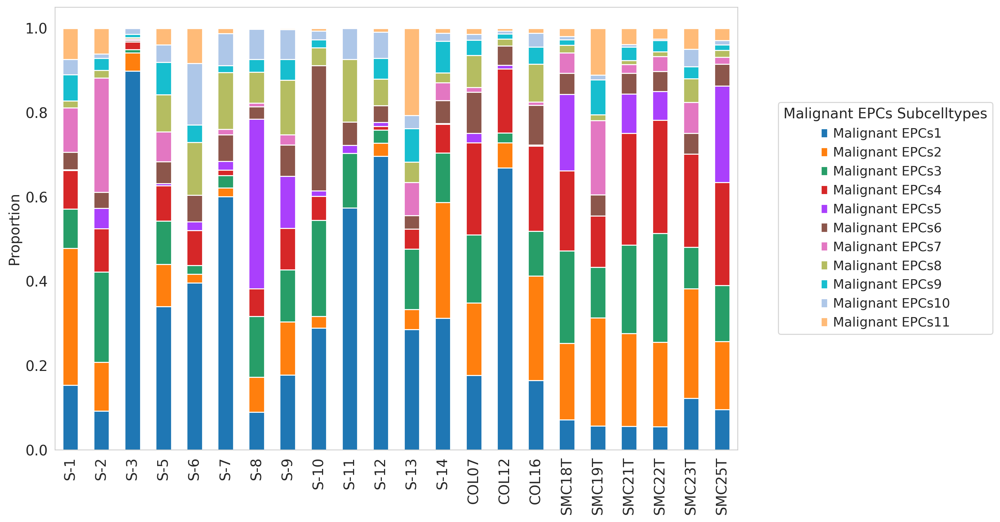

In [228]:
import pandas as pd
import matplotlib.pyplot as plt

batch = adata_epi.obs['batch']
cell_type = adata_epi.obs['Epi_Cluster']

# 创建DataFrame
df = pd.DataFrame({'batch': batch, 'CellType': cell_type})

# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['batch', 'CellType']).size().unstack(fill_value=0)

# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)

# 重新排序数据
new_order = ['S-1', 'S-2', 'S-3', 'S-5', 'S-6', 'S-7', 'S-8', 'S-9', 'S-10', 'S-11', 'S-12', 'S-13', 'S-14', 'COL07', 'COL12', 'COL16', 'SMC18T', 'SMC19T', 'SMC21T', 'SMC22T', 'SMC23T', 'SMC25T']
grouped_ratios = grouped_ratios.reindex(new_order)

# 创建图形并指定图形的大小
fig, ax = plt.subplots(figsize=(12, 8))  # 更改图形的大小，(宽度, 高度)

# 绘制堆积条形图
grouped_ratios.plot.bar(stacked=True, ax=ax)

# 设置图例和轴标签
leg = ax.legend(title='Malignant EPCs Subcelltypes', bbox_to_anchor=(1.05, 0.8), loc='upper left')
for line in leg.get_lines():
    line.set_linewidth(1)  # 更改图例线条的宽度

ax.set_xlabel('')
ax.set_ylabel('Proportion')

# 去掉网格
ax.grid(False)

# 保存并显示图形
plt.savefig('Malignant EPCs_cellproportion_batch_polished.pdf', dpi=300, bbox_inches='tight')
plt.show()


In [229]:
grouped_ratios.to_csv("adata_epi_batch_cellproportion.csv")

In [230]:
grouped_ratios

CellType,Malignant EPCs1,Malignant EPCs2,Malignant EPCs3,Malignant EPCs4,Malignant EPCs5,Malignant EPCs6,Malignant EPCs7,Malignant EPCs8,Malignant EPCs9,Malignant EPCs10,Malignant EPCs11
batch,,,,,,,,,,,
S-1,0.153386,0.325199,0.093127,0.091633,0.001494,0.041335,0.105578,0.016434,0.061753,0.036355,0.073705
S-2,0.091968,0.116064,0.213655,0.102811,0.048996,0.037349,0.271888,0.018072,0.028514,0.010040,0.060643
S-3,0.898917,0.043321,0.007220,0.018051,0.000000,0.003610,0.003610,0.003610,0.007220,0.014440,0.000000
S-5,0.339623,0.100629,0.102725,0.083857,0.005241,0.051363,0.071279,0.088050,0.076520,0.041929,0.038784
S-6,0.395833,0.020833,0.020833,0.083333,0.020833,0.062500,0.000000,0.125000,0.041667,0.145833,0.083333
S-7,0.600840,0.021008,0.029412,0.012605,0.021008,0.063025,0.012605,0.134454,0.016807,0.075630,0.012605
S-8,0.090057,0.082655,0.144338,0.065384,0.402665,0.029114,0.008636,0.073032,0.030101,0.072292,0.001727
S-9,0.178082,0.126027,0.123288,0.098630,0.123288,0.073973,0.024658,0.128767,0.049315,0.071233,0.002740
S-10,0.289308,0.027254,0.228512,0.056604,0.012579,0.297694,0.000000,0.041929,0.018868,0.020964,0.006289


In [231]:
df = pd.read_csv('adata_epi_cellproportion.csv', index_col=None)
df

,Metastases,Malignant EPCs1,Malignant EPCs2,Malignant EPCs3,Malignant EPCs4,Malignant EPCs5,Malignant EPCs6,Malignant EPCs7,Malignant EPCs8,Malignant EPCs9,Malignant EPCs10,Malignant EPCs11
0,With Metastases,0.223934,0.161180,0.144884,0.191341,0.038268,0.086022,0.016945,0.062510,0.035917,0.019539,0.019458
1,Without Metastases,0.113081,0.166654,0.168533,0.122323,0.161545,0.039447,0.088286,0.036141,0.035465,0.034488,0.034037


In [232]:
adata_epi.obs['Metastases'].value_counts()

Without Metastases    13309
With Metastases       12334
Name: Metastases, dtype: int64

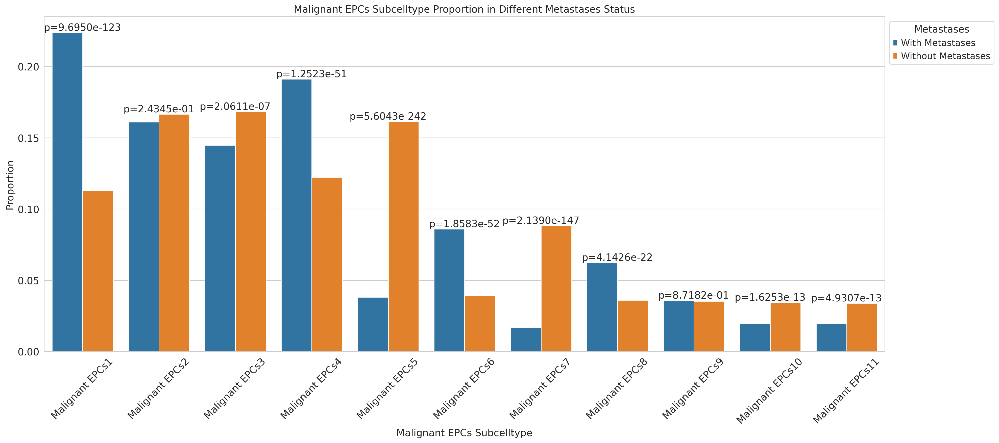

In [240]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns

df = pd.read_csv('adata_epi_cellproportion.csv', index_col=None)
df

# 细胞数
cell_count_with_metastases = 13309
cell_count_without_metastases = 12334

cell_types = df.columns[1:]

# 进行循环计算卡方检验，并记录P值
chi2_test_p_values = []

for cell_type in cell_types:
    group_with_metastases_proportion = df.loc[df['Metastases'] == 'With Metastases', cell_type].values[0]
    group_without_metastases_proportion = df.loc[df['Metastases'] == 'Without Metastases', cell_type].values[0]

    # 计算各组的细胞数
    group_with_metastases_count = group_with_metastases_proportion * cell_count_with_metastases
    group_without_metastases_count = group_without_metastases_proportion * cell_count_without_metastases

    # 进行独立性卡方检验
    chi2_statistic, p_value_chi2, _, _ = stats.chi2_contingency([[group_with_metastases_count, cell_count_with_metastases - group_with_metastases_count],
                                                                 [group_without_metastases_count, cell_count_without_metastases - group_without_metastases_count]])

    # 将P值添加到列表中
    chi2_test_p_values.append(p_value_chi2)

# 绘制柱状图

df_melted = df.melt(id_vars='Metastases', var_name='Cell Type', value_name='Value')

# 设置绘图风格和背景色
sns.set_style("whitegrid")
plt.figure(figsize=(20, 9))

# 绘制柱状图
bar_plot = sns.barplot(x='Cell Type', y='Value', hue='Metastases', data=df_melted)

# 设置坐标轴标签和标题
plt.xlabel('Malignant EPCs Subcelltype')
plt.ylabel('Proportion')
plt.title('Malignant EPCs Subcelltype Proportion in Different Metastases Status')

# 调整 x 轴标签的角度
plt.xticks(rotation=45)

# 调整图例位置
plt.legend(title='Metastases', bbox_to_anchor=(1, 1), loc='upper left')

for i, p_value in enumerate(chi2_test_p_values):
    max_value = df_melted[df_melted['Cell Type'] == cell_types[i]]['Value'].max() 
    plt.text(i, max_value, f"p={p_value:.4e}", ha="center", va="bottom")
# 调整布局并保存图像
plt.tight_layout()
plt.savefig("barplot_Malignant EPCs_proportion_pvalues_by_metastases.pdf")
plt.show()


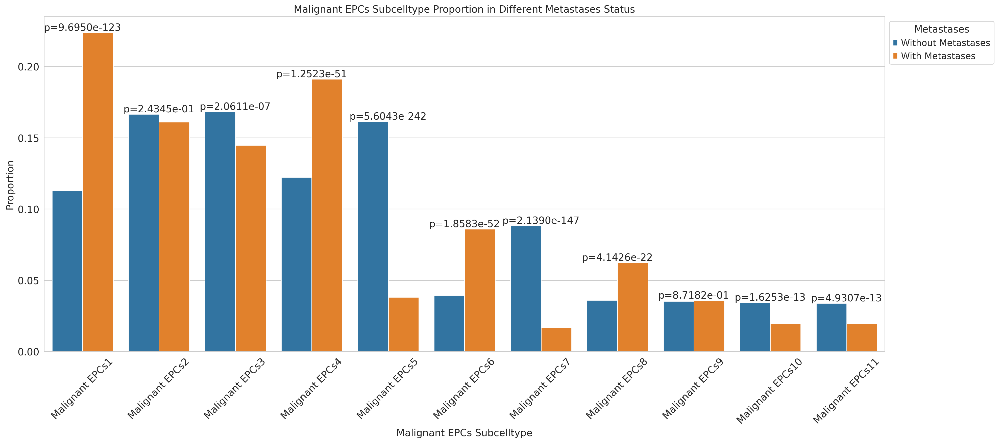

In [243]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns

df = pd.read_csv('adata_epi_cellproportion.csv', index_col=None)
df

# 细胞数
cell_count_with_metastases = 13309
cell_count_without_metastases = 12334

cell_types = df.columns[1:]

# 进行循环计算卡方检验，并记录P值
chi2_test_p_values = []

for cell_type in cell_types:
    group_with_metastases_proportion = df.loc[df['Metastases'] == 'With Metastases', cell_type].values[0]
    group_without_metastases_proportion = df.loc[df['Metastases'] == 'Without Metastases', cell_type].values[0]

    # 计算各组的细胞数
    group_with_metastases_count = group_with_metastases_proportion * cell_count_with_metastases
    group_without_metastases_count = group_without_metastases_proportion * cell_count_without_metastases

    # 进行独立性卡方检验
    chi2_statistic, p_value_chi2, _, _ = stats.chi2_contingency([[group_with_metastases_count, cell_count_with_metastases - group_with_metastases_count],
                                                                 [group_without_metastases_count, cell_count_without_metastases - group_without_metastases_count]])

    # 将P值添加到列表中
    chi2_test_p_values.append(p_value_chi2)

# 绘制柱状图
df_melted = df.melt(id_vars='Metastases', var_name='Cell Type', value_name='Value')

# 设置绘图风格和背景色
sns.set_style("whitegrid")
plt.figure(figsize=(20, 9))

# 调整 'Metastases' 列的顺序
order = ['Without Metastases', 'With Metastases']

# 绘制柱状图，并指定顺序
bar_plot = sns.barplot(x='Cell Type', y='Value', hue='Metastases', data=df_melted, order=cell_types, hue_order=order)

# 设置坐标轴标签和标题
plt.xlabel('Malignant EPCs Subcelltype')
plt.ylabel('Proportion')
plt.title('Malignant EPCs Subcelltype Proportion in Different Metastases Status')

# 调整 x 轴标签的角度
plt.xticks(rotation=45)

# 调整图例位置
plt.legend(title='Metastases', bbox_to_anchor=(1, 1), loc='upper left')

for i, p_value in enumerate(chi2_test_p_values):
    max_value = df_melted[df_melted['Cell Type'] == cell_types[i]]['Value'].max() 
    plt.text(i, max_value, f"p={p_value:.4e}", ha="center", va="bottom")
    
# 调整布局并保存图像
plt.tight_layout()
plt.savefig("barplot_Malignant EPCs_proportion_pvalues_by_metastases.pdf")
plt.show()


In [2]:
#adata_epi=sc.read("YS_fib_after_subcelltype_new.h5ad")

In [235]:
import scanpy as sc

# Assuming adata_sub2 is your preprocessed AnnData object

# Load your Hallmark gmt file and parse it into a dictionary where keys are the pathway names and values are the gene lists
# Assuming you have a function named load_gmt that does this
def load_gmt(filename):
    with open(filename, 'r') as f:
        lines = f.readlines()
    
    hallmark_dict = {}
    for line in lines:
        # Split the line into parts
        parts = line.strip().split('\t')
        
        # The first part is the pathway name
        pathway = parts[0]
        
        # Remove 'HALLMARK_' from the pathway name
        pathway = pathway.replace('HALLMARK_', '')
        
        # The rest are the genes
        genes = parts[1:]
        
        # Add to dictionary
        hallmark_dict[pathway] = genes

    return hallmark_dict


hallmark_dict = load_gmt("h.all.v2023.1.Hs.symbols.gmt")

# Loop over the dictionary
for pathway in hallmark_dict:
    # Get the gene list for the current pathway
    gene_list = hallmark_dict[pathway]
    
    # Compute the score for this pathway
    sc.tl.score_genes(adata_epi, gene_list=gene_list, score_name=pathway, use_raw=True)


computing score 'TNFA_SIGNALING_VIA_NFKB'
    finished: added
    'TNFA_SIGNALING_VIA_NFKB', score of gene set (adata.obs).
    742 total control genes are used. (0:00:01)
computing score 'HYPOXIA'
    finished: added
    'HYPOXIA', score of gene set (adata.obs).
    995 total control genes are used. (0:00:01)
computing score 'CHOLESTEROL_HOMEOSTASIS'
    finished: added
    'CHOLESTEROL_HOMEOSTASIS', score of gene set (adata.obs).
    745 total control genes are used. (0:00:01)
computing score 'MITOTIC_SPINDLE'
    finished: added
    'MITOTIC_SPINDLE', score of gene set (adata.obs).
    497 total control genes are used. (0:00:01)
computing score 'WNT_BETA_CATENIN_SIGNALING'
    finished: added
    'WNT_BETA_CATENIN_SIGNALING', score of gene set (adata.obs).
    700 total control genes are used. (0:00:01)
computing score 'TGF_BETA_SIGNALING'
    finished: added
    'TGF_BETA_SIGNALING', score of gene set (adata.obs).
    550 total control genes are used. (0:00:01)
computing score 'IL6

    finished: added
    'MYC_TARGETS_V1', score of gene set (adata.obs).
    396 total control genes are used. (0:00:01)
computing score 'MYC_TARGETS_V2'
    finished: added
    'MYC_TARGETS_V2', score of gene set (adata.obs).
    397 total control genes are used. (0:00:01)
computing score 'EPITHELIAL_MESENCHYMAL_TRANSITION'
    finished: added
    'EPITHELIAL_MESENCHYMAL_TRANSITION', score of gene set (adata.obs).
    796 total control genes are used. (0:00:01)
computing score 'INFLAMMATORY_RESPONSE'
    finished: added
    'INFLAMMATORY_RESPONSE', score of gene set (adata.obs).
    991 total control genes are used. (0:00:01)
computing score 'XENOBIOTIC_METABOLISM'
    finished: added
    'XENOBIOTIC_METABOLISM', score of gene set (adata.obs).
    1092 total control genes are used. (0:00:01)
computing score 'FATTY_ACID_METABOLISM'
    finished: added
    'FATTY_ACID_METABOLISM', score of gene set (adata.obs).
    1044 total control genes are used. (0:00:01)
computing score 'OXIDATIVE_

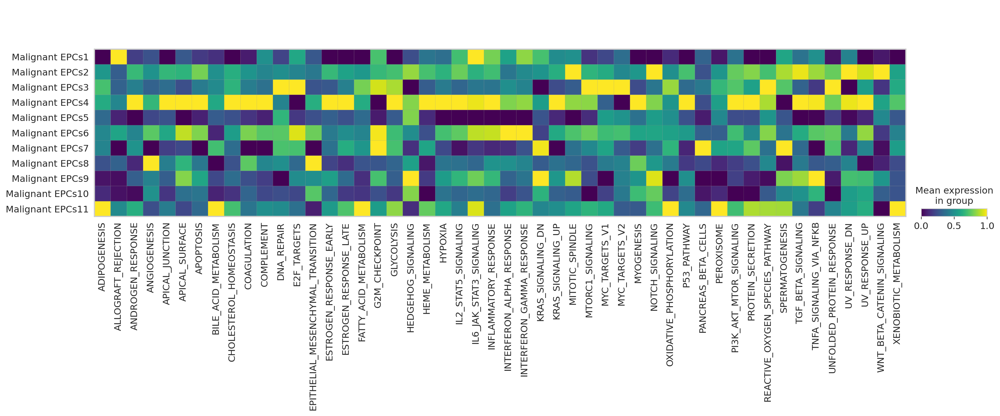

In [236]:
sc.pl.matrixplot(adata_epi, var_names=['ADIPOGENESIS', 'ALLOGRAFT_REJECTION', 'ANDROGEN_RESPONSE', 'ANGIOGENESIS', 'APICAL_JUNCTION', 'APICAL_SURFACE', 'APOPTOSIS', 'BILE_ACID_METABOLISM', 'CHOLESTEROL_HOMEOSTASIS', 'COAGULATION', 'COMPLEMENT', 'DNA_REPAIR', 'E2F_TARGETS', 'EPITHELIAL_MESENCHYMAL_TRANSITION', 'ESTROGEN_RESPONSE_EARLY', 'ESTROGEN_RESPONSE_LATE', 'FATTY_ACID_METABOLISM', 'G2M_CHECKPOINT', 'GLYCOLYSIS', 'HEDGEHOG_SIGNALING', 'HEME_METABOLISM', 'HYPOXIA', 'IL2_STAT5_SIGNALING', 'IL6_JAK_STAT3_SIGNALING', 'INFLAMMATORY_RESPONSE', 'INTERFERON_ALPHA_RESPONSE', 'INTERFERON_GAMMA_RESPONSE', 'KRAS_SIGNALING_DN', 'KRAS_SIGNALING_UP', 'MITOTIC_SPINDLE', 'MTORC1_SIGNALING', 'MYC_TARGETS_V1', 'MYC_TARGETS_V2', 'MYOGENESIS', 'NOTCH_SIGNALING', 'OXIDATIVE_PHOSPHORYLATION', 'P53_PATHWAY', 'PANCREAS_BETA_CELLS', 'PEROXISOME', 'PI3K_AKT_MTOR_SIGNALING', 'PROTEIN_SECRETION', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'SPERMATOGENESIS', 'TGF_BETA_SIGNALING', 'TNFA_SIGNALING_VIA_NFKB', 'UNFOLDED_PROTEIN_RESPONSE', 'UV_RESPONSE_DN', 'UV_RESPONSE_UP', 'WNT_BETA_CATENIN_SIGNALING', 'XENOBIOTIC_METABOLISM'], groupby='Epi_Cluster', use_raw=True, dendrogram=False, cmap='viridis', standard_scale='var', swap_axes=False, save='epi_hallmarks.pdf')

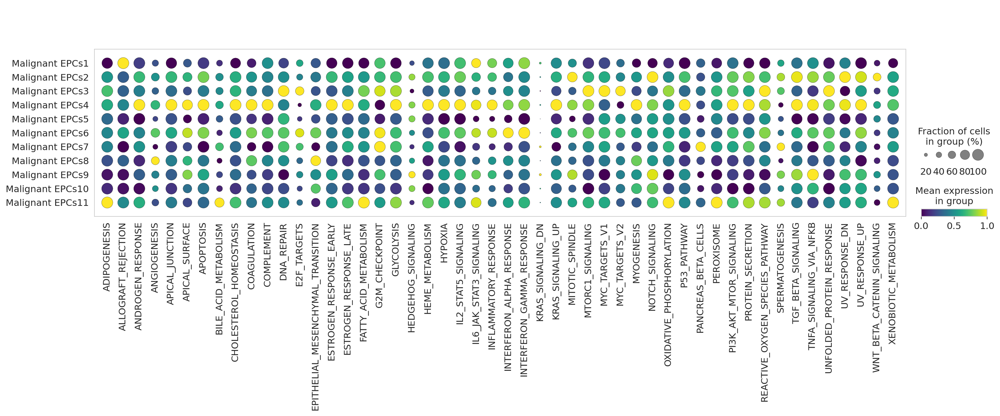

In [237]:
sc.pl.dotplot(adata_epi, var_names=['ADIPOGENESIS', 'ALLOGRAFT_REJECTION', 'ANDROGEN_RESPONSE', 'ANGIOGENESIS', 'APICAL_JUNCTION', 'APICAL_SURFACE', 'APOPTOSIS', 'BILE_ACID_METABOLISM', 'CHOLESTEROL_HOMEOSTASIS', 'COAGULATION', 'COMPLEMENT', 'DNA_REPAIR', 'E2F_TARGETS', 'EPITHELIAL_MESENCHYMAL_TRANSITION', 'ESTROGEN_RESPONSE_EARLY', 'ESTROGEN_RESPONSE_LATE', 'FATTY_ACID_METABOLISM', 'G2M_CHECKPOINT', 'GLYCOLYSIS', 'HEDGEHOG_SIGNALING', 'HEME_METABOLISM', 'HYPOXIA', 'IL2_STAT5_SIGNALING', 'IL6_JAK_STAT3_SIGNALING', 'INFLAMMATORY_RESPONSE', 'INTERFERON_ALPHA_RESPONSE', 'INTERFERON_GAMMA_RESPONSE', 'KRAS_SIGNALING_DN', 'KRAS_SIGNALING_UP', 'MITOTIC_SPINDLE', 'MTORC1_SIGNALING', 'MYC_TARGETS_V1', 'MYC_TARGETS_V2', 'MYOGENESIS', 'NOTCH_SIGNALING', 'OXIDATIVE_PHOSPHORYLATION', 'P53_PATHWAY', 'PANCREAS_BETA_CELLS', 'PEROXISOME', 'PI3K_AKT_MTOR_SIGNALING', 'PROTEIN_SECRETION', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'SPERMATOGENESIS', 'TGF_BETA_SIGNALING', 'TNFA_SIGNALING_VIA_NFKB', 'UNFOLDED_PROTEIN_RESPONSE', 'UV_RESPONSE_DN', 'UV_RESPONSE_UP', 'WNT_BETA_CATENIN_SIGNALING', 'XENOBIOTIC_METABOLISM'], groupby='Epi_Cluster', use_raw=True, dendrogram=False,cmap='viridis', standard_scale="var" ,swap_axes=False, save='epimal_hallmarks.pdf')

In [131]:
adata.obs['Fib_Epi_Cluster']

AAACCTGGTTACTGAC-1-S-1         COL11A1+ CAFs
AAAGCAATCCCATTTA-1-S-1         COL11A1+ CAFs
AACACGTGTGCTTCTC-1-S-1           CCL11+ CAFs
AACCGCGAGTGTCCCG-1-S-1          CXCL14+ CAFs
AACTCCCTCAGCTCGG-1-S-1         COL11A1+ CAFs
                                  ...       
TTTGCGCCATGGAATA-1-SMC25T    Malignant_EPCs1
TTTGCGCCATGTTCCC-1-SMC25T    Malignant_EPCs3
TTTGGTTGTAGGGTAC-1-SMC25T    Malignant_EPCs1
TTTGTCAAGAGGGATA-1-SMC25T    Malignant_EPCs1
TTTGTCATCCCAAGTA-1-SMC25T    Malignant_EPCs5
Name: Fib_Epi_Cluster, Length: 29545, dtype: category
Categories (13, object): ['CCL11+ CAFs', 'COL11A1+ CAFs', 'CXCL5+ CAFs', 'CXCL14+ CAFs', ..., 'Malignant_EPCs3', 'Malignant_EPCs4', 'Malignant_EPCs5', 'RGS5+ CAFs']

In [132]:
adata_epi.obs['Fib_Cluster']

AAACCTGGTTACTGAC-1-S-1        SFRP2+ CAFs
AAAGCAATCCCATTTA-1-S-1        SFRP2+ CAFs
AACACGTGTGCTTCTC-1-S-1        CCL11+ CAFs
AACCGCGAGTGTCCCG-1-S-1       CXCL14+ CAFs
AACTCCCTCAGCTCGG-1-S-1        SFRP2+ CAFs
                                 ...     
ATTATCCTCCGCATAA-1-SMC25T     CXCL1+ CAFs
CAACCAACAGCTCGCA-1-SMC25T     CXCL1+ CAFs
CAGAATCCAATAGCGG-1-SMC25T     CXCL1+ CAFs
CAGCTAAAGCCCAGCT-1-SMC25T     CXCL1+ CAFs
TCTCTAACATCGTCGG-1-SMC25T     CXCL1+ CAFs
Name: Fib_Cluster, Length: 3902, dtype: category
Categories (6, object): ['SFRP2+ CAFs' < 'RGS5+ CAFs' < 'CXCL1+ CAFs' < 'CXCL14+ CAFs' < 'MYH11+ CAFs' < 'CCL11+ CAFs']

In [244]:
adata_fib_epi = sc.concat([adata_fib, adata_epi], join="outer", label="Fib_Epi_Cluster")
adata_fib_epi

AnnData object with n_obs × n_vars = 29545 × 5000
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'Fib_Epi_Cluster', 'Metastases', 'Fib_Cluster', 'TNFA_SIGNALING_VIA_NFKB', 'HYPOXIA', 'CHOLESTEROL_HOMEOSTASIS', 'MITOTIC_SPINDLE', 'WNT_BETA_CATENIN_SIGNALING', 'TGF_BETA_SIGNALING', 'IL6_JAK_STAT3_SIGNALING', 'DNA_REPAIR', 'G2M_CHECKPOINT', 'APOPTOSIS', 'NOTCH_SIGNALING', 'ADIPOGENESIS', 'ESTROGEN_RESPONSE_EARLY', 'ESTROGEN_RESPONSE_LATE', 'ANDROGEN_RESPONSE', 'MYOGENESIS', 'PROTEIN_SECRETION', 'INTERFERON_ALPHA_RESPONSE', 'INTERFERON_GAMMA_RESPONSE', 'APICAL_JUNCTION', 'APICAL_SURFACE', 'HEDGEHOG_SIGNALING', 'COMPLEMENT', 'UNFOLDED_PROTEIN_RESPONSE', 'PI3K_AKT_MTOR_SIGNALING', 'MTORC1_SIGNALING', 'E2F_TARGETS', 'MYC_TARGETS_V1', 'MYC_TARGETS_V2', 'EPITHELIAL_MESENCHYMAL_TRANSITION', 'INFLAMMATORY_RESPONSE', 'XENOBIOTIC_METABOLISM', 'FATTY_ACID_METABOLISM', 'OXIDATIVE_PHOSPHORYL

In [245]:
fib_cluster = adata_fib.obs['Fib_Cluster']

# 从adata_epi中提取'Mal_Epi_Cluster'列
epi_cluster = adata_epi.obs['Epi_Cluster']

# 使用concat函数将两个列合并为新的列'Fib_Epi_Cluster'
merged_cluster = pd.concat([fib_cluster, epi_cluster], axis=0)

# 将新的列添加到adata_fib中
adata_fib_epi.obs['Fib_Epi_Cluster'] = merged_cluster

In [ ]:
adata_fib_epi.obs['Fib_Epi_Cluster'] = adata_fib_epi.obs['Fib_Epi_Cluster'].astype('category')
categories = adata_fib_epi.obs['Fib_Epi_Cluster'].cat.categories
new_order = ['SFRP2+ CAFs',
'RGS5+ CAFs',
'CXCL1+ CAFs',
'CXCL14+ CAFs',
'MYH11+ CAFs',
'CCL11+ CAFs',
'Malignant EPCs1',
'Malignant EPCs2',
'Malignant EPCs3',
'Malignant EPCs4',
'Malignant EPCs5',
'Malignant EPCs6',
'Malignant EPCs7',
'Malignant EPCs8',
'Malignant EPCs9',
'Malignant EPCs10',
'Malignant EPCs11']
adata_fib_epi.obs['Fib_Epi_Cluster'] = adata_fib_epi.obs['Fib_Epi_Cluster'].cat.reorder_categories(new_order, ordered=True)


In [248]:
adata_fib_epi.obs['Fib_Epi_Cluster'] 

AAACCTGGTTACTGAC-1-S-1            SFRP2+ CAFs
AAAGCAATCCCATTTA-1-S-1            SFRP2+ CAFs
AACACGTGTGCTTCTC-1-S-1            CCL11+ CAFs
AACCGCGAGTGTCCCG-1-S-1           CXCL14+ CAFs
AACTCCCTCAGCTCGG-1-S-1            SFRP2+ CAFs
                                   ...       
TTTGCGCCATGGAATA-1-SMC25T     Malignant EPCs2
TTTGCGCCATGTTCCC-1-SMC25T     Malignant EPCs5
TTTGGTTGTAGGGTAC-1-SMC25T    Malignant EPCs11
TTTGTCAAGAGGGATA-1-SMC25T     Malignant EPCs4
TTTGTCATCCCAAGTA-1-SMC25T     Malignant EPCs1
Name: Fib_Epi_Cluster, Length: 29545, dtype: category
Categories (17, object): ['SFRP2+ CAFs' < 'RGS5+ CAFs' < 'CXCL1+ CAFs' < 'CXCL14+ CAFs' ... 'Malignant EPCs8' < 'Malignant EPCs9' < 'Malignant EPCs10' < 'Malignant EPCs11']

In [249]:
adata.obs['Fib_Epi_Cluster']=adata_fib_epi.obs['Fib_Epi_Cluster'] 

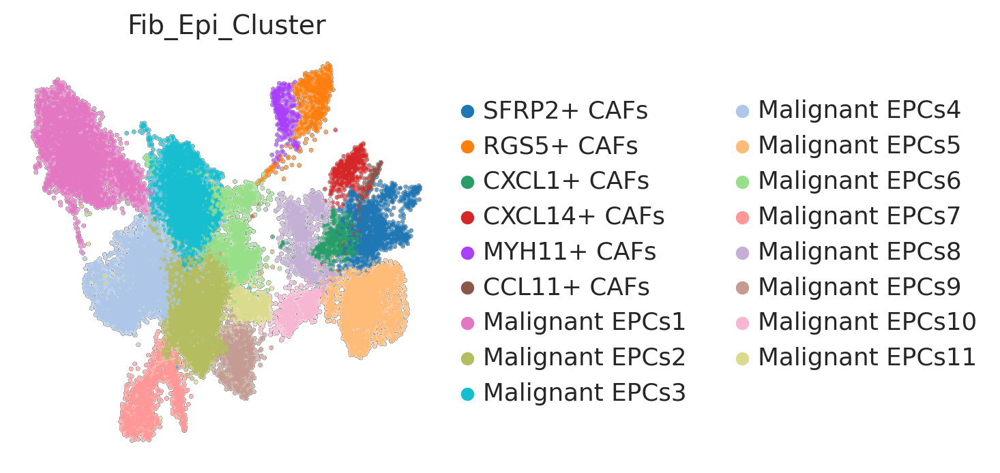

In [251]:
sc.pl.umap(adata,color='Fib_Epi_Cluster',frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), size=15,
           save='Fib_Epi_Cluster_allcelltype.pdf')

In [252]:
#adata.write('/mnt/g/YS_work2/5.Fib_Epi/YS_adata_fib_epi_after_newcelltype.h5ad',compression='gzip')

In [254]:
metastases_status = {
    'S-1': 'Without Metastases',
    'S-2': 'Without Metastases',
    'S-3': 'With Metastases',
    'S-5': 'With Metastases',
    'S-6': 'Without Metastases',
    'S-7': 'With Metastases',
    'S-8': 'Without Metastases',
    'S-9': 'With Metastases',
    'S-10': 'With Metastases',
    'S-11': 'Without Metastases',
    'S-12': 'Without Metastases',
    'S-13': 'With Metastases',
    'S-14': 'Without Metastases',
    'COL07': 'With Metastases',
    'COL12': 'With Metastases',
    'COL16': 'With Metastases',
    'SMC18T': 'Without Metastases',
    'SMC19T': 'Without Metastases',
    'SMC21T': 'With Metastases',
    'SMC22T': 'Without Metastases',
    'SMC23T': 'Without Metastases',
    'SMC25T': 'With Metastases',
}
adata.obs['Metastases'] = adata.obs['batch'].map(metastases_status)

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'Metastases' as categorical
... storing 'Metastases' as categorical


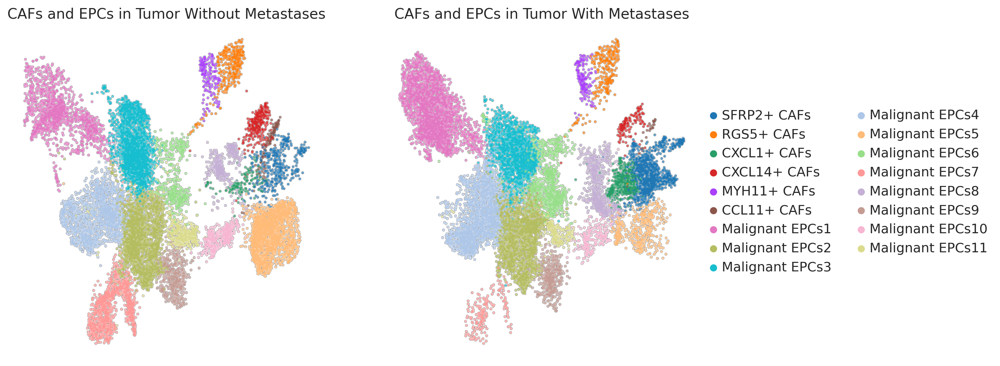

In [255]:
import scanpy as sc
import matplotlib.pyplot as plt

# Assuming you have an AnnData object named 'adata'
TnM_data = adata[adata.obs['Metastases'] == 'Without Metastases']
TM_data = adata[adata.obs['Metastases'] == 'With Metastases']

# Create a new figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))

# Plot the first UMAP with a different colormap, for example, 'viridis'
sc.pl.umap(TnM_data, color=['Fib_Epi_Cluster'],
           legend_loc='', frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), size=20, use_raw=True, ax=ax1, show=False,title='CAFs and EPCs in Tumor Without Metastases')

# Plot the second UMAP with a different colormap, for example, 'plasma'
sc.pl.umap(TM_data, color=['Fib_Epi_Cluster'],
           legend_loc='right margin', frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), size=20, use_raw=True, ax=ax2, show=False,title='CAFs and EPCs in Tumor With Metastases')

# Save the figure as a PDF
plt.savefig('combined_umaps CAFs and EPCs.pdf', dpi=300, bbox_inches='tight')
plt.show()


In [257]:
adata.obs.to_csv("/mnt/g/YS_work2/5.Fib_Epi/adata_fib_epi_subcelltype_obs_infor.csv",index=True)

In [259]:
adata.to_df().reset_index().to_csv("/mnt/g/YS_work2/5.Fib_Epi/adata_fib_epi_subcelltype_scaled_data.csv", index=False)

In [262]:
cell_indices = merged_adata.obs_names
adata2 = raw[cell_indices]
adata2

View of AnnData object with n_obs × n_vars = 29545 × 36601
    obs: 'predicted_doublets', 'batch'
    var: 'gene_ids'

In [263]:
adata2.write('/mnt/g/YS_work2/5.Fib_Epi/YS_adata_fib_epi_raw.h5ad',compression='gzip')

In [260]:
adata2.var['mt'] = adata2.var_names.str.startswith('MT-')
adata2.var['rp'] = adata2.var_names.str.startswith('RPL') | adata2.var_names.str.startswith('RPS')
sc.pp.calculate_qc_metrics(adata2, qc_vars=['mt','rp'], percent_top=None, log1p=False, inplace=True)
adata2 = adata2[adata2.obs.n_genes_by_counts < 8000, :]
adata2 = adata2[adata2.obs.pct_counts_mt < 20, :]
adata2 = adata2[adata2.obs.pct_counts_rp < 50, :]
sc.pp.normalize_total(adata2, target_sum=1e4)
sc.pp.log1p(adata2)

/tmp/ipykernel_118124/2923203768.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata2.var['mt'] = adata2.var_names.str.startswith('MT-')
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [261]:
adata2.to_df().reset_index().to_csv("/mnt/g/YS_work2/5.Fib_Epi/adata_fib_epi_subcelltype_normalized_data.csv", index=False)

In [6]:
adata2=sc.read('/mnt/g/YS_work2/5.Fib_Epi/YS_adata_fib_epi_after_newcelltype.h5ad')

In [15]:
metastases_status = {
    'S-1': 'Without Metastases',
    'S-2': 'Without Metastases',
    'S-3': 'With Metastases',
    'S-5': 'With Metastases',
    'S-6': 'Without Metastases',
    'S-7': 'With Metastases',
    'S-8': 'Without Metastases',
    'S-9': 'With Metastases',
    'S-10': 'With Metastases',
    'S-11': 'Without Metastases',
    'S-12': 'Without Metastases',
    'S-13': 'With Metastases',
    'S-14': 'Without Metastases',
    'COL07': 'With Metastases',
    'COL12': 'With Metastases',
    'COL16': 'With Metastases',
    'SMC18T': 'Without Metastases',
    'SMC19T': 'Without Metastases',
    'SMC21T': 'With Metastases',
    'SMC22T': 'Without Metastases',
    'SMC23T': 'Without Metastases',
    'SMC25T': 'With Metastases',
}
adata2.obs['Metastases'] = adata2.obs['batch'].map(metastases_status)

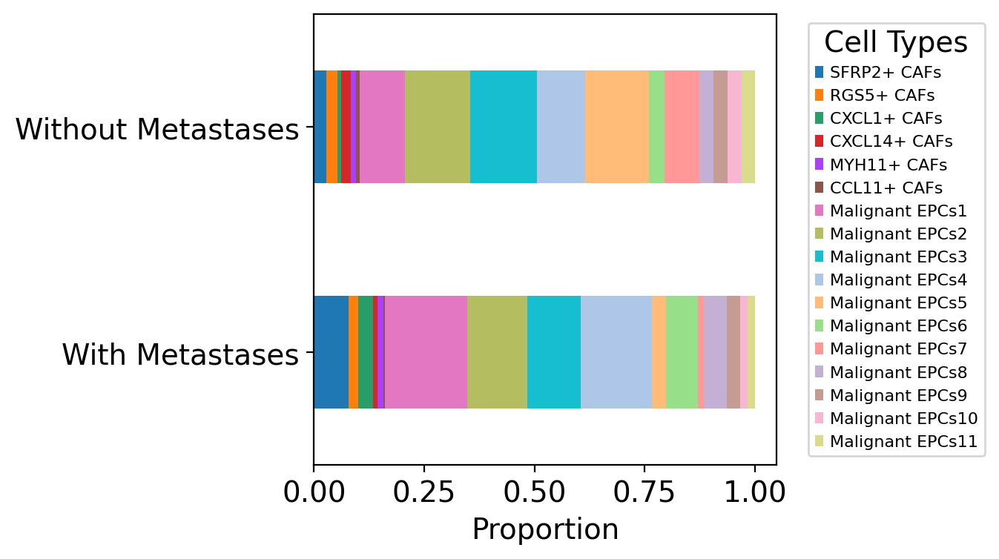

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# 从adata_stro提取数据
metastases = adata2.obs['Metastases']
cell_type = adata2.obs['Fib_Epi_Cluster']

# 创建DataFrame
df = pd.DataFrame({'Metastases': metastases, 'CellType': cell_type})

# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['Metastases', 'CellType']).size().unstack(fill_value=0)

# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)


# 绘制条形图
ax = grouped_ratios.plot.barh(stacked=True)  
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left',prop={'size': 8})
ax.set_xlabel('Proportion')
ax.set_ylabel('')

# 去掉网格
ax.grid(False)

# 显示图形
plt.savefig('Fib_Epi_cellproportion_metastasis_barplot.pdf', dpi=300, bbox_inches='tight')
plt.show()

In [27]:
grouped_ratios.to_csv("adata_fib_epi_cellproportion.csv")

In [28]:
grouped_counts.to_csv("adata_fib_epi_cellcount.csv")
grouped_counts

CellType,SFRP2+ CAFs,RGS5+ CAFs,CXCL1+ CAFs,CXCL14+ CAFs,MYH11+ CAFs,CCL11+ CAFs,Malignant EPCs1,Malignant EPCs2,Malignant EPCs3,Malignant EPCs4,Malignant EPCs5,Malignant EPCs6,Malignant EPCs7,Malignant EPCs8,Malignant EPCs9,Malignant EPCs10,Malignant EPCs11
Metastases,,,,,,,,,,,,,,,,,
With Metastases,1153,315,497,161,191,35,2762,1988,1787,2360,472,1061,209,771,443,241,240
Without Metastases,411,366,132,323,182,136,1505,2218,2243,1628,2150,525,1175,481,472,459,453


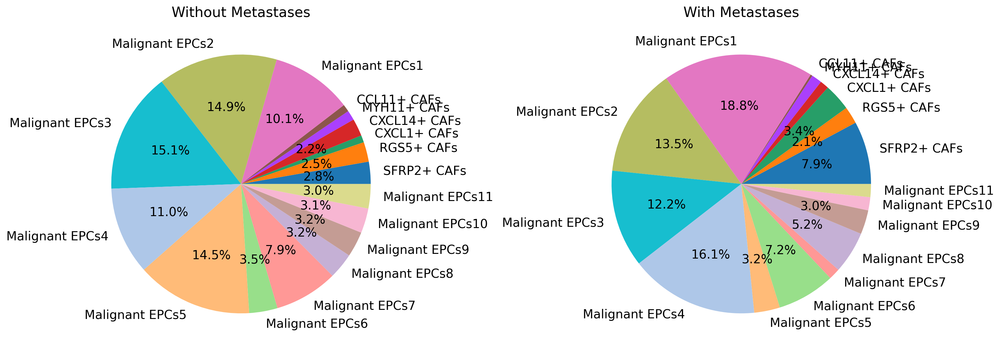

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# 读取csv文件
df = pd.read_csv('adata_fib_epi_cellproportion.csv', index_col='Metastases')

# 对DataFrame按照索引进行排序
df.sort_index(ascending=False, inplace=True)

# 初始化图形
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# 自定义函数，决定是否显示百分比
def autopct_format(values):
    def my_format(pct):
        return ('%1.1f%%' % pct) if pct > 2 else ''
    return my_format

# 绘制饼图
for i, (index, row) in enumerate(df.iterrows()):
    wedges, texts, autotexts = ax[i].pie(row, labels=row.index, autopct=autopct_format(row))
    ax[i].set_title(index, fontsize=16)

# 调整图形
plt.tight_layout()

# 保存图形
plt.savefig('Fib_epi_pie_subcelltype.pdf', dpi=600, bbox_inches='tight')

# 显示图形
plt.show()


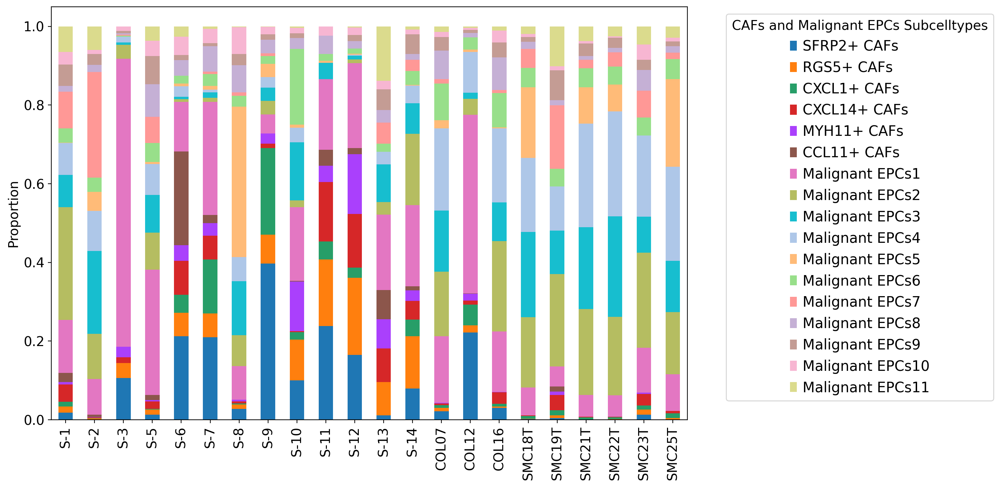

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

batch = adata2.obs['batch']
cell_type = adata2.obs['Fib_Epi_Cluster']

# 创建DataFrame
df = pd.DataFrame({'batch': batch, 'CellType': cell_type})

# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['batch', 'CellType']).size().unstack(fill_value=0)

# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)

# 重新排序数据
new_order = ['S-1', 'S-2', 'S-3', 'S-5', 'S-6', 'S-7', 'S-8', 'S-9', 'S-10', 'S-11', 'S-12', 'S-13', 'S-14', 'COL07', 'COL12', 'COL16', 'SMC18T', 'SMC19T', 'SMC21T', 'SMC22T', 'SMC23T', 'SMC25T']
grouped_ratios = grouped_ratios.reindex(new_order)

# 创建图形并指定图形的大小
fig, ax = plt.subplots(figsize=(12, 8))  # 更改图形的大小，(宽度, 高度)

# 绘制堆积条形图
grouped_ratios.plot.bar(stacked=True, ax=ax)

# 设置图例和轴标签
leg = ax.legend(title='CAFs and Malignant EPCs Subcelltypes', bbox_to_anchor=(1.05, 1), loc='upper left',prop={'size': 15})
for line in leg.get_lines():
    line.set_linewidth(1)  # 更改图例线条的宽度

ax.set_xlabel('')
ax.set_ylabel('Proportion')

# 去掉网格
ax.grid(False)

# 保存并显示图形
plt.savefig('CAFs and Malignant EPCs_cellproportion_batch_polished.pdf', dpi=300, bbox_inches='tight')
plt.show()


In [37]:
grouped_ratios.to_csv("adata_fib_epi_batch_cellproportion.csv")

In [38]:
df = pd.read_csv('adata_fib_epi_cellproportion.csv', index_col=None)
df

,Metastases,SFRP2+ CAFs,RGS5+ CAFs,CXCL1+ CAFs,CXCL14+ CAFs,MYH11+ CAFs,CCL11+ CAFs,Malignant EPCs1,Malignant EPCs2,Malignant EPCs3,Malignant EPCs4,Malignant EPCs5,Malignant EPCs6,Malignant EPCs7,Malignant EPCs8,Malignant EPCs9,Malignant EPCs10,Malignant EPCs11
0,With Metastases,0.07851,0.021449,0.033842,0.010963,0.013006,0.002383,0.188070,0.135367,0.121681,0.160697,0.032139,0.072246,0.014231,0.052499,0.030165,0.01641,0.016342
1,Without Metastases,0.02766,0.024632,0.008884,0.021738,0.012248,0.009153,0.101285,0.149270,0.150952,0.109563,0.144693,0.035332,0.079077,0.032371,0.031765,0.03089,0.030487


In [39]:
adata2.obs['Metastases'].value_counts()

Without Metastases    14859
With Metastases       14686
Name: Metastases, dtype: int64

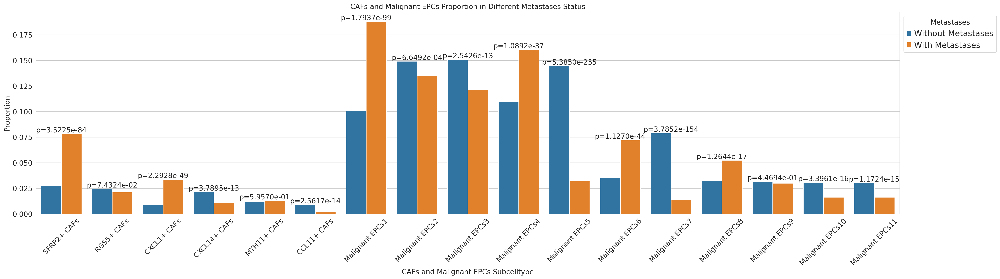

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns

df = pd.read_csv('adata_fib_epi_cellproportion.csv', index_col=None)
df

# 细胞数
cell_count_with_metastases = 14859
cell_count_without_metastases = 14686
cell_types = df.columns[1:]

# 进行循环计算卡方检验，并记录P值
chi2_test_p_values = []

for cell_type in cell_types:
    group_with_metastases_proportion = df.loc[df['Metastases'] == 'With Metastases', cell_type].values[0]
    group_without_metastases_proportion = df.loc[df['Metastases'] == 'Without Metastases', cell_type].values[0]

    # 计算各组的细胞数
    group_with_metastases_count = group_with_metastases_proportion * cell_count_with_metastases
    group_without_metastases_count = group_without_metastases_proportion * cell_count_without_metastases

    # 进行独立性卡方检验
    chi2_statistic, p_value_chi2, _, _ = stats.chi2_contingency([[group_with_metastases_count, cell_count_with_metastases - group_with_metastases_count],
                                                                 [group_without_metastases_count, cell_count_without_metastases - group_without_metastases_count]])

    # 将P值添加到列表中
    chi2_test_p_values.append(p_value_chi2)

# 绘制柱状图
df_melted = df.melt(id_vars='Metastases', var_name='Cell Type', value_name='Value')

# 设置绘图风格和背景色
sns.set_style("whitegrid")
plt.figure(figsize=(28,8))

# 调整 'Metastases' 列的顺序
order = ['Without Metastases', 'With Metastases']

# 绘制柱状图，并指定顺序
bar_plot = sns.barplot(x='Cell Type', y='Value', hue='Metastases', data=df_melted, order=cell_types, hue_order=order)

#设置坐标轴标签和标题
plt.xlabel('CAFs and Malignant EPCs Subcelltype')
plt.ylabel('Proportion')
plt.title('CAFs and Malignant EPCs Proportion in Different Metastases Status')

# 调整 x 轴标签的角度
plt.xticks(rotation=45)

# 调整图例位置
plt.legend(title='Metastases', bbox_to_anchor=(1, 1), loc='upper left',prop={'size': 16})

for i, p_value in enumerate(chi2_test_p_values):
    max_value = df_melted[df_melted['Cell Type'] == cell_types[i]]['Value'].max() 
    plt.text(i, max_value, f"p={p_value:.4e}", ha="center", va="bottom")
# 调整布局并保存图像
plt.tight_layout()
plt.savefig("barplot_CAFs_Malignant EPCs_proportion_pvalues_by_metastases.pdf")
plt.show()

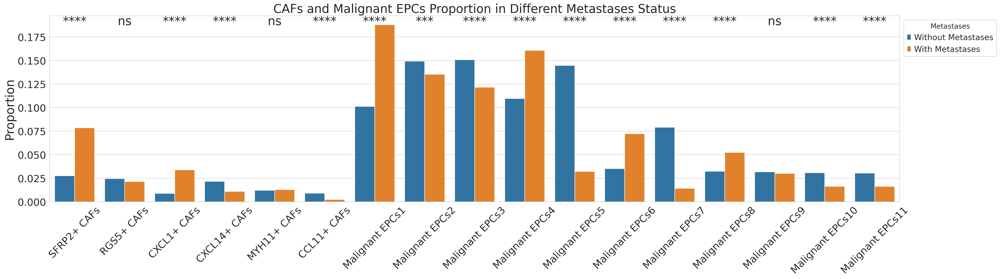

In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
from decimal import Decimal

df = pd.read_csv('adata_fib_epi_cellproportion.csv', index_col=None)
df

# 细胞数
cell_count_with_metastases = 14859
cell_count_without_metastases = 14686
cell_types = df.columns[1:]

# 进行循环计算卡方检验，并记录P值
chi2_test_p_values = []

for cell_type in cell_types:
    group_with_metastases_proportion = df.loc[df['Metastases'] == 'With Metastases', cell_type].values[0]
    group_without_metastases_proportion = df.loc[df['Metastases'] == 'Without Metastases', cell_type].values[0]

    # 计算各组的细胞数
    group_with_metastases_count = group_with_metastases_proportion * cell_count_with_metastases
    group_without_metastases_count = group_without_metastases_proportion * cell_count_without_metastases

    # 进行独立性卡方检验
    chi2_statistic, p_value_chi2, _, _ = stats.chi2_contingency([[group_with_metastases_count, cell_count_with_metastases - group_with_metastases_count],
                                                                 [group_without_metastases_count, cell_count_without_metastases - group_without_metastases_count]])

    # 将P值添加到列表中
    chi2_test_p_values.append(p_value_chi2)

# 绘制柱状图
df_melted = df.melt(id_vars='Metastases', var_name='Cell Type', value_name='Value')

# 设置绘图风格和背景色
sns.set_style("whitegrid")
plt.figure(figsize=(28,8))

# 调整 'Metastases' 列的顺序
order = ['Without Metastases', 'With Metastases']

# 绘制柱状图，并指定顺序
bar_plot = sns.barplot(x='Cell Type', y='Value', hue='Metastases', data=df_melted, order=cell_types, hue_order=order)

#设置坐标轴标签和标题
plt.xlabel('')
plt.ylabel('Proportion',fontsize=24)
plt.title('CAFs and Malignant EPCs Proportion in Different Metastases Status',fontsize=24)

# 调整 x 轴标签的角度
plt.xticks(rotation=45,fontsize=20)
plt.yticks(fontsize=20)
# 调整图例位置
plt.legend(title='Metastases', bbox_to_anchor=(1, 1), loc='upper left',prop={'size': 16})

for i, p_value in enumerate(chi2_test_p_values):
    max_value = df_melted[df_melted['Cell Type'] == cell_types[i]]['Value'].max()
    
    # 将p值转换为相应的星号标记
    if p_value > 0.05:
        star_annotation = "ns"
    elif p_value <= 0.05 and p_value > 0.01:
        star_annotation = "*"
    elif p_value <= 0.01 and p_value > 0.001:
        star_annotation = "**"
    elif p_value <= 0.001 and p_value > 0.0001:
        star_annotation = "***"
    else:
        star_annotation = "****"
        
    plt.text(i, 0.185, star_annotation, ha="center", va="bottom",fontsize=24)
# 调整布局并保存图像
plt.tight_layout()
plt.savefig("barplot_CAFs_Malignant EPCs_proportion_pvalues_by_metastases_p*.pdf")
plt.show()

In [21]:
p_value_formatted

'1.17e-15'

In [22]:
float(p_value_formatted)

1.17e-15

In [24]:
p_value_decimal

Decimal('1.17E-15')

In [33]:
p_value

1.1723668325031564e-15

In [29]:
float(p_value)<0.0001

True

In [34]:
Decimal(p_value) <= Decimal(threshold)

True

In [ ]:
pvalue_mapping = {0.05: '*', 0.01: '**', 0.001: '***', 0.0001: '****'}

for i, p_value in enumerate(chi2_test_p_values):
    max_value = df_melted[df_melted['Cell Type'] == cell_types[i]]['Value'].max() 
    p_str = 'ns'
    if p_value <= 0.05:
        for threshold in sorted(pvalue_mapping.keys(), reverse=True):
            if Decimal(p_value) <= Decimal(threshold):
                p_str = pvalue_mapping[threshold]
                break